# **Instalation**

In [ ]:
pip install matplotlib

In [ ]:
pip install numpy

In [ ]:
pip instak scikit-learn

In [ ]:
pip install tensorflow

In [ ]:
pip install matplotlib

# **Imports**

In [57]:
# Imports
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import ParameterGrid
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import json
import os


# **Model**

In [50]:
# Function to create the CNN model
def create_model(input_shape, optimizer='adam', loss_fn='mse'):
    model = Sequential([
        Conv1D(64, kernel_size=2, activation='relu', input_shape=input_shape),
        Conv1D(32, kernel_size=2, activation='relu'),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.3),  # Adding dropout to prevent overfitting
        Dense(64, activation='relu'),
        Dense(3)  # Output layer for the 3 direction components
    ])
    model.compile(optimizer=optimizer, loss=loss_fn, metrics=['mae'])
    return model

# **Plot functions**

In [60]:
# Plotting functions
def plot_loss_and_mae(history, class_name):
    # Plotting loss
    plt.figure(figsize=(12, 6))
    plt.plot(history['loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title(f'Model Loss for {class_name}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Plotting MAE
    plt.figure(figsize=(12, 6))
    plt.plot(history['mae'], label='Train MAE')
    plt.plot(history['val_mae'], label='Validation MAE')
    plt.title(f'Model MAE for {class_name}')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend()
    plt.show()

def plot_true_vs_pred(y_test, y_pred, class_name):
    # XY Plane
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test[:, 0], y_test[:, 1], label='True Directions', alpha=0.5)
    plt.scatter(y_pred[:, 0], y_pred[:, 1], label='Predicted Directions', alpha=0.5)
    plt.title(f'Comparison of True and Predicted Directions for {class_name} (XY Plane)')
    plt.xlabel('X Direction')
    plt.ylabel('Y Direction')
    plt.legend()
    plt.show()

    # XZ Plane
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test[:, 0], y_test[:, 2], label='True Directions', alpha=0.5)
    plt.scatter(y_pred[:, 0], y_pred[:, 2], label='Predicted Directions', alpha=0.5)
    plt.title(f'Comparison of True and Predicted Directions for {class_name} (XZ Plane)')
    plt.xlabel('X Direction')
    plt.ylabel('Z Direction')
    plt.legend()
    plt.show()

    # YZ Plane
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test[:, 1], y_test[:, 2], label='True Directions', alpha=0.5)
    plt.scatter(y_pred[:, 1], y_pred[:, 2], label='Predicted Directions', alpha=0.5)
    plt.title(f'Comparison of True and Predicted Directions for {class_name} (YZ Plane)')
    plt.xlabel('Y Direction')
    plt.ylabel('Z Direction')
    plt.legend()
    plt.show()

def plot_residuals(class_name, comparison_df):
    # Calculate residuals for each coordinate
    residuals_x = comparison_df['true_x'].values - comparison_df['pred_x'].values
    residuals_y = comparison_df['true_y'].values - comparison_df['pred_y'].values
    residuals_z = comparison_df['true_z'].values - comparison_df['pred_z'].values

    # Plot Histogram for X coordinate residuals
    plt.figure(figsize=(12, 6))
    plt.hist(residuals_x, bins=50, color='purple', alpha=0.6)
    plt.axvline(x=0, color='black', linestyle='--', linewidth=0.8)
    plt.title(f'Residuals Histogram for X Coordinate - {class_name}')
    plt.xlabel('Residual (True X - Predicted X)')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

    # Plot Histogram for Y coordinate residuals
    plt.figure(figsize=(12, 6))
    plt.hist(residuals_y, bins=50, color='blue', alpha=0.6)
    plt.axvline(x=0, color='black', linestyle='--', linewidth=0.8)
    plt.title(f'Residuals Histogram for Y Coordinate - {class_name}')
    plt.xlabel('Residual (True Y - Predicted Y)')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

    # Plot Histogram for Z coordinate residuals
    plt.figure(figsize=(12, 6))
    plt.hist(residuals_z, bins=50, color='green', alpha=0.6)
    plt.axvline(x=0, color='black', linestyle='--', linewidth=0.8)
    plt.title(f'Residuals Histogram for Z Coordinate - {class_name}')
    plt.xlabel('Residual (True Z - Predicted Z)')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

# Function to plot combined results
def plot_combined_results(histories, predictions):
    # Separate loss plot
    plt.figure(figsize=(12, 6))
    for class_name, history in histories.items():
        plt.plot(history['loss'], label=f'{class_name} Train Loss')
    plt.title('Combined Model Train Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Separate validation loss plot
    plt.figure(figsize=(12, 6))
    for class_name, history in histories.items():
        plt.plot(history['val_loss'], label=f'{class_name} Validation Loss')
    plt.title('Combined Model Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Loss')
    plt.legend()
    plt.show()

    # Separate MAE plot
    plt.figure(figsize=(12, 6))
    for class_name, history in histories.items():
        plt.plot(history['mae'], label=f'{class_name} Train MAE')
    plt.title('Combined Model Train MAE')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend()
    plt.show()

    # Separate validation MAE plot
    plt.figure(figsize=(12, 6))
    for class_name, history in histories.items():
        plt.plot(history['val_mae'], label=f'{class_name} Validation MAE')
    plt.title('Combined Model Validation MAE')
    plt.xlabel('Epoch')
    plt.ylabel('Validation MAE')
    plt.legend()
    plt.show()

# **Data preparation**

In [54]:
# Function to load and preprocess data
def load_and_preprocess_data(file_list, target_class):
    for file in file_list:
        class_name = file.split('_')[-1].split('.')[0]  # Extract class name from file name
        if class_name == target_class:
            df = pd.read_hdf(file, "y")
            X = df[['jmuon_dir_x', 'jmuon_dir_y', 'jmuon_dir_z', 'jmuon_likelihood']].values
            y = df[['dir_x', 'dir_y', 'dir_z']].values

            # Replace NaNs with zeros
            X = np.nan_to_num(X)
            y = np.nan_to_num(y)

            return X, y
    raise ValueError(f"Class {target_class} not found in file list.")


file_list = [
    'atm_neutrino_classA.h5', 'atm_neutrino_classB.h5', 'atm_neutrino_classC.h5', 'atm_neutrino_classD.h5',
    'atm_neutrino_classE.h5', 'atm_neutrino_classF.h5', 'atm_neutrino_classG.h5', 'atm_neutrino_classH.h5'
]

results = {}
histories = {}
predictions = {}


In [6]:
data = load_and_preprocess_data(file_list, 'classA')
data

(array([[-8.00045733e-02, -1.38303317e-01, -9.87153210e-01,
          5.63915027e+01],
        [ 8.77165151e-02,  8.69920161e-01, -4.85329503e-01,
          1.09102307e+02],
        [ 7.45612023e-02,  9.61560325e-01,  2.64277068e-01,
          4.76508443e+01],
        ...,
        [ 2.65909785e-03, -5.22860602e-01, -8.52414055e-01,
          4.10782818e+01],
        [-3.88724866e-01, -4.16375859e-01,  8.21902745e-01,
          2.97533206e+01],
        [-1.78340376e-01, -3.50097996e-01,  9.19579308e-01,
          3.25085533e+01]]),
 array([[-0.04267864, -0.23472526, -0.97112439],
        [ 0.14727986,  0.88143217, -0.44876048],
        [-0.77812669,  0.33399661,  0.53194466],
        ...,
        [ 0.10942167, -0.49838145, -0.8600249 ],
        [-0.84861318,  0.48039117,  0.22154006],
        [ 0.82308651, -0.41881998,  0.38356019]]))

# **Traning model function**

In [55]:
# Function to train the model with given hyperparameters
def train_model(class_name, X, y, epochs, batch_size, optimizer_type, loss_fn_type, show_plot=True):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Normalize the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Reshape data to fit Conv1D input requirements
    X_train_cnn = np.expand_dims(X_train_scaled, axis=2)
    X_test_cnn = np.expand_dims(X_test_scaled, axis=2)

    # Create and train the model
    model = create_model((X_train_cnn.shape[1], X_train_cnn.shape[2]), optimizer=optimizer_type, loss_fn=loss_fn_type)
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    history = model.fit(X_train_cnn, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2,
                        callbacks=[early_stopping])

    # Evaluate the model
    loss, mae = model.evaluate(X_test_cnn, y_test)
    print(f'Test MAE for {class_name}: {mae}')

    # Store the results
    results[class_name] = {'model': model, 'mae': mae}
    histories[class_name] = history.history

    # Make predictions
    y_pred = model.predict(X_test_cnn)
    predictions[class_name] = (y_test, y_pred)

    # Compare predicted directions with true directions
    comparison = pd.DataFrame({
        'true_x': y_test[:, 0], 'true_y': y_test[:, 1], 'true_z': y_test[:, 2],
        'pred_x': y_pred[:, 0], 'pred_y': y_pred[:, 1], 'pred_z': y_pred[:, 2]
    })
    print(f'Comparison for {class_name}:')
    print(comparison.head())

    if(show_plot):
      # Plot loss and MAE for the current class
      plot_loss_and_mae(history.history, class_name)
      # Plot true vs predicted directions for the current class
      plot_true_vs_pred(y_test, y_pred, class_name)
      plot_residuals(class_name, comparison)
    return mae


# **Hyperparameterization**

In [56]:
# Function to run experiment with hyperparameters for a single class
def run_hyperparameterization(file_list, class_name, batch_size, lr, epochs, patience, optimizer_type, loss_fn_type):
    X, y = load_and_preprocess_data(file_list, class_name)
    best_loss = float('inf')
    best_params = None

    print(f"Training on class {class_name} with parameters: batch_size={batch_size}, lr={lr}, epochs={epochs}, patience={patience}, optimizer_type={optimizer_type}, loss_fn_type={loss_fn_type}")
    mae = train_model(class_name, X, y, epochs, batch_size, optimizer_type, loss_fn_type, show_plot=False)

    if mae < best_loss:
        best_loss = mae
        best_params = {
            'batch_size': batch_size,
            'lr': lr,
            'epochs': epochs,
            'patience': patience,
            'optimizer_type': optimizer_type,
            'loss_fn_type': loss_fn_type
        }

    return best_params, best_loss


def hyperparameterization(file_list, class_name):
    # Hyperparameter grid
    param_grid = {
        'optimizer_type': ['adam', 'sgd'],
        'loss_fn_type': ['mse', 'mae'],
        'lr': [0.0001, 0.001, 0.01],
        'batch_size': [16, 32, 64, 128],
        'epochs': [50],
        'patience': [10]
    }

    best_overall_params = None
    best_overall_loss = float('inf')

    # Iterate over all combinations of hyperparameters
    print(f"Starting hyperparameterization for class {class_name}")
    for params in ParameterGrid(param_grid):
        print(f"Params: {params}")
        best_params, best_loss = run_hyperparameterization(
            file_list,
            class_name,
            params['batch_size'],
            params['lr'],
            params['epochs'],
            params['patience'],
            params['optimizer_type'],
            params['loss_fn_type']
        )
        print(f"Best Validation Loss for current set: {best_loss:.4f}")
        if best_loss < best_overall_loss:
            best_overall_loss = best_loss
            best_overall_params = best_params

    print(f"Best Overall Parameters for class {class_name}: {best_overall_params}")
    print(f"Best Overall Validation Loss for class {class_name}: {best_overall_loss:.4f}")
    return best_overall_params



# **Application of hyperparameterization on data from class A**

In [ ]:
class_name = 'classA'
best_params = hyperparameterization(file_list, class_name)

# **Checking the best parameters**

In [58]:
def save_best_params(params, filename='best_params.txt'):
    with open(filename, 'w') as file:
        json.dump(params, file)

def load_best_params(filename='best_params.txt'):
    if os.path.exists(filename):
        with open(filename, 'r') as file:
            return json.load(file)
    else:
        return None

if best_params:
    save_best_params(best_params)
else:
    best_params = load_best_params()

print(best_params)


{'batch_size': 16, 'lr': 0.001, 'epochs': 50, 'patience': 10, 'optimizer_type': 'sgd', 'loss_fn_type': 'mae'}


# **Training the model on class A data**

Epoch 1/50


c:\Users\DADEN\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


323/323 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4743 - mae: 0.4743 - val_loss: 0.3923 - val_mae: 0.3923
Epoch 2/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3847 - mae: 0.3847 - val_loss: 0.3130 - val_mae: 0.3130
Epoch 3/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3286 - mae: 0.3286 - val_loss: 0.2765 - val_mae: 0.2765
Epoch 4/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3014 - mae: 0.3014 - val_loss: 0.2714 - val_mae: 0.2714
Epoch 5/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2931 - mae: 0.2931 - val_loss: 0.2698 - val_mae: 0.2698
Epoch 6/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2903 - mae: 0.2903 - val_loss: 0.2669 - val_mae: 0.2669
Epoch 7/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2886 - mae: 0.2886 - val_loss: 0.2655 - val_mae: 0.2655
Epoch 8/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2902 - mae: 0.2902 - val_loss: 0.2655 - val_mae: 0.2655
Epoch 9/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2862 

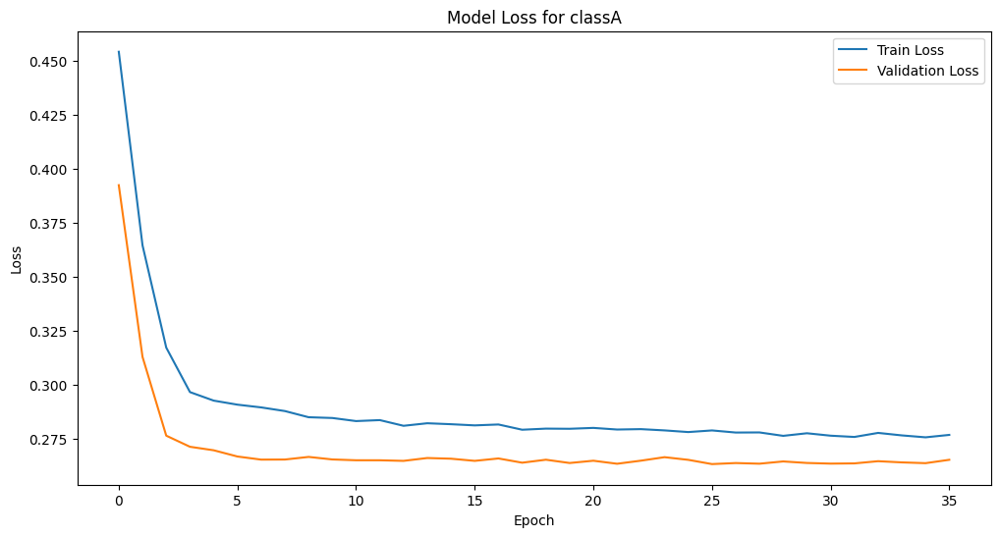

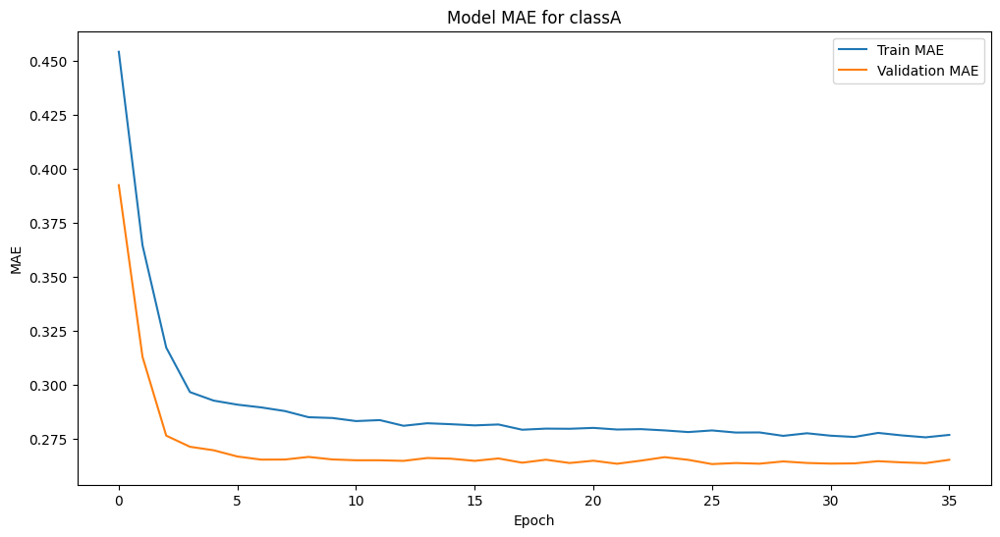

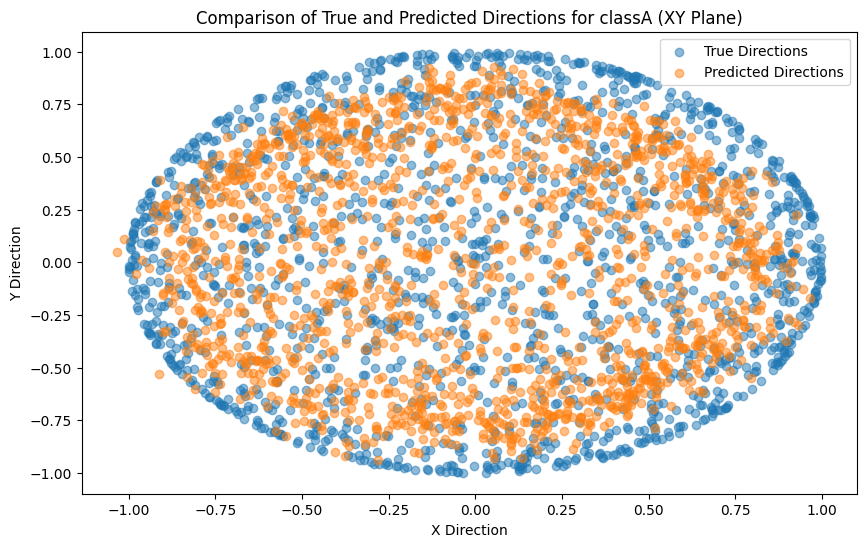

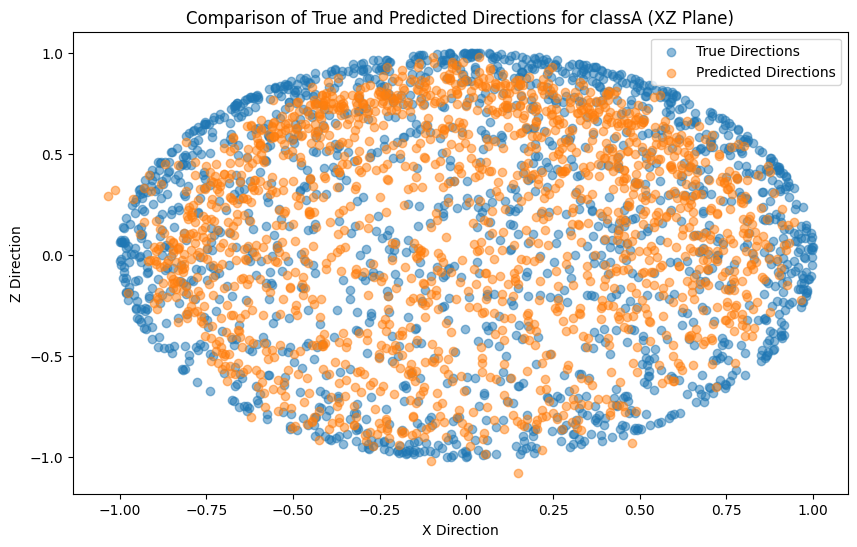

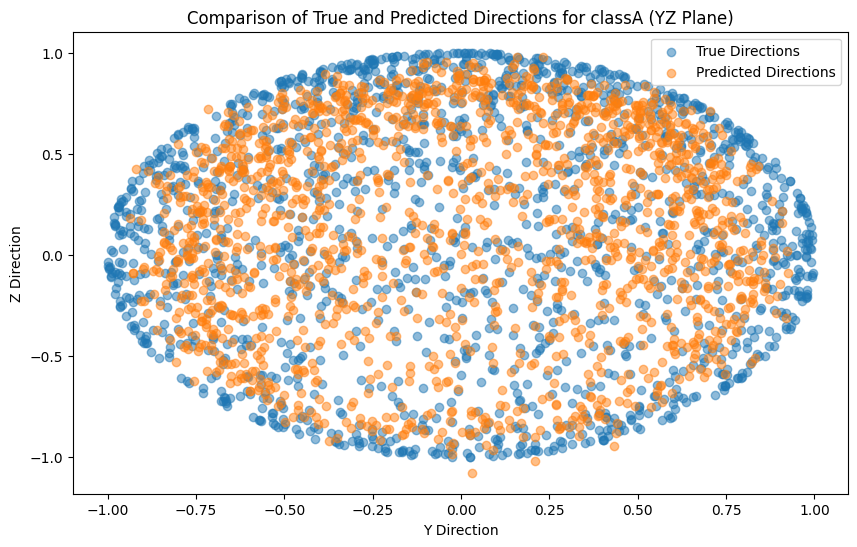

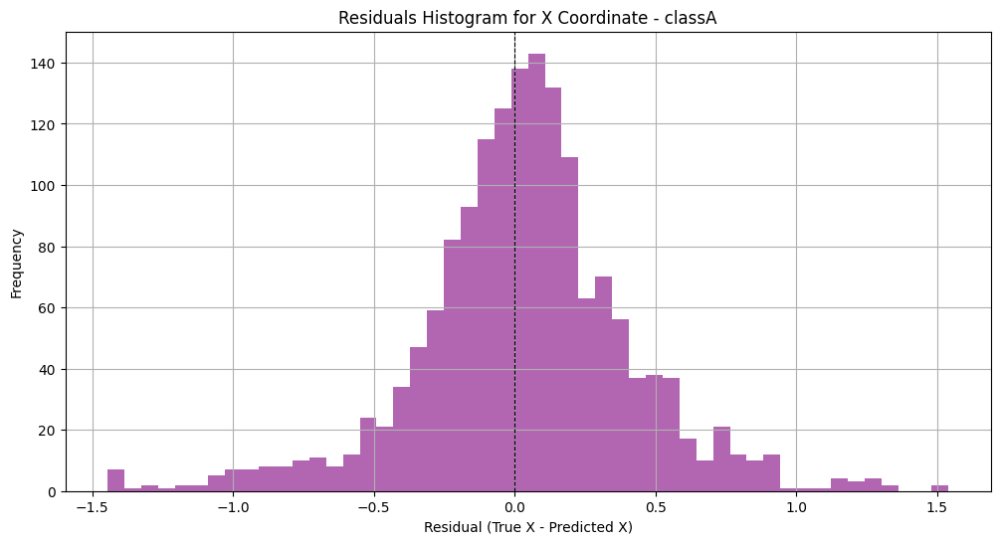

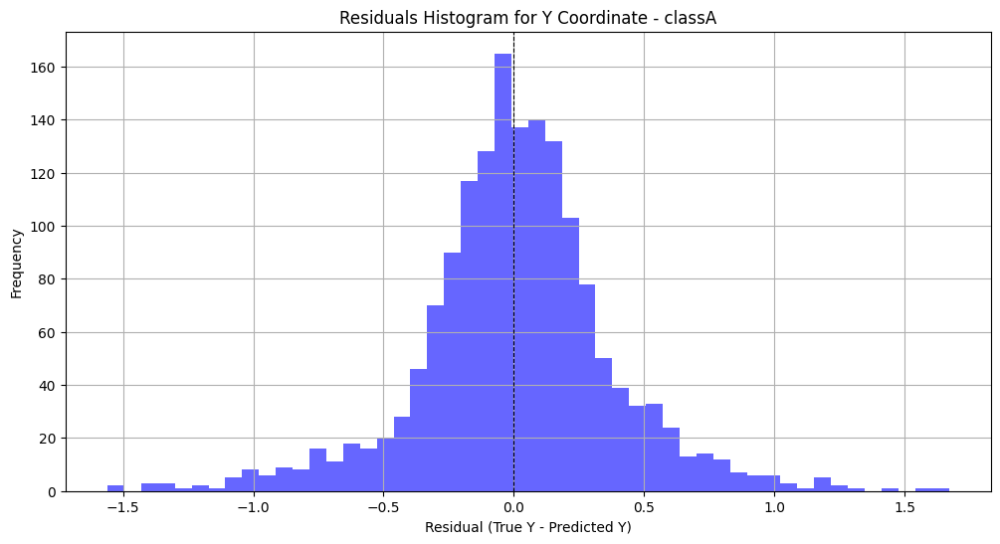

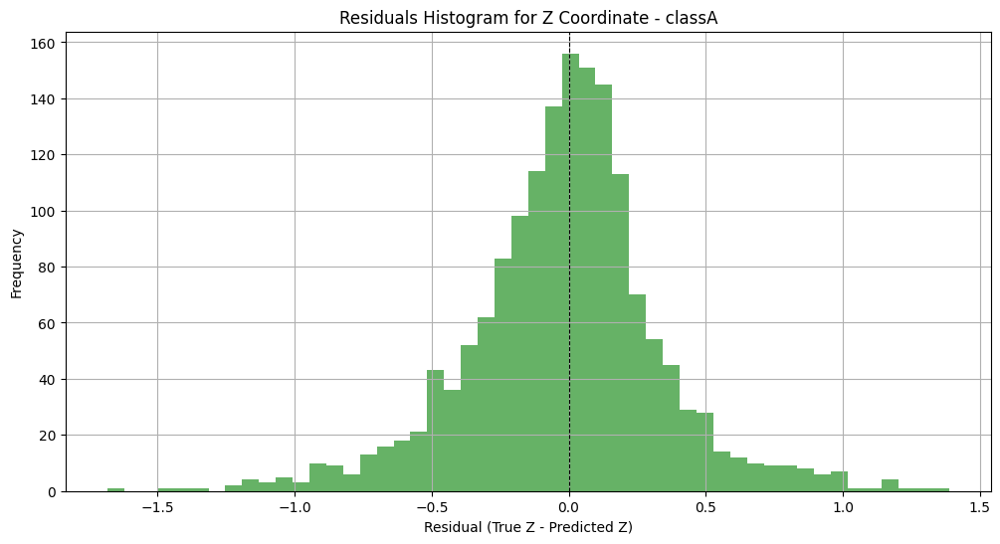

In [61]:
class_name = 'classA'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Training the model on class B data**

Epoch 1/50


c:\Users\DADEN\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1023/1023 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4044 - mae: 0.4044 - val_loss: 0.1954 - val_mae: 0.1954
Epoch 2/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2298 - mae: 0.2298 - val_loss: 0.1877 - val_mae: 0.1877
Epoch 3/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2205 - mae: 0.2205 - val_loss: 0.1847 - val_mae: 0.1847
Epoch 4/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2131 - mae: 0.2131 - val_loss: 0.1863 - val_mae: 0.1863
Epoch 5/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2115 - mae: 0.2115 - val_loss: 0.1859 - val_mae: 0.1859
Epoch 6/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2121 - mae: 0.2121 - val_loss: 0.1850 - val_mae: 0.1850
Epoch 7/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2059 - mae: 0.2059 - val_loss: 0.1833 - val_mae: 0.1833
Epoch 8/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.2065 - mae: 0.2065 - val_loss: 0.1833 - val_mae: 0.1833
Epoch 9/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/st

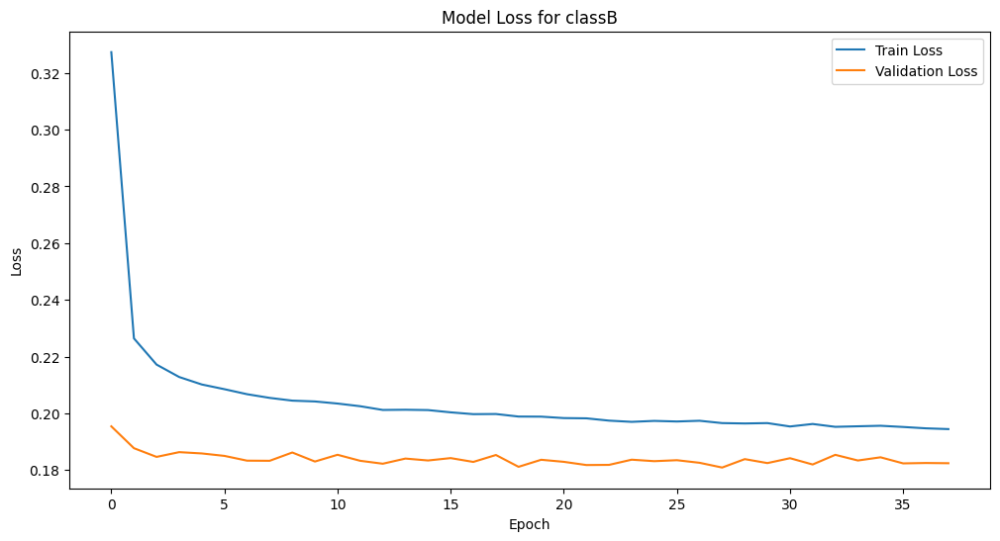

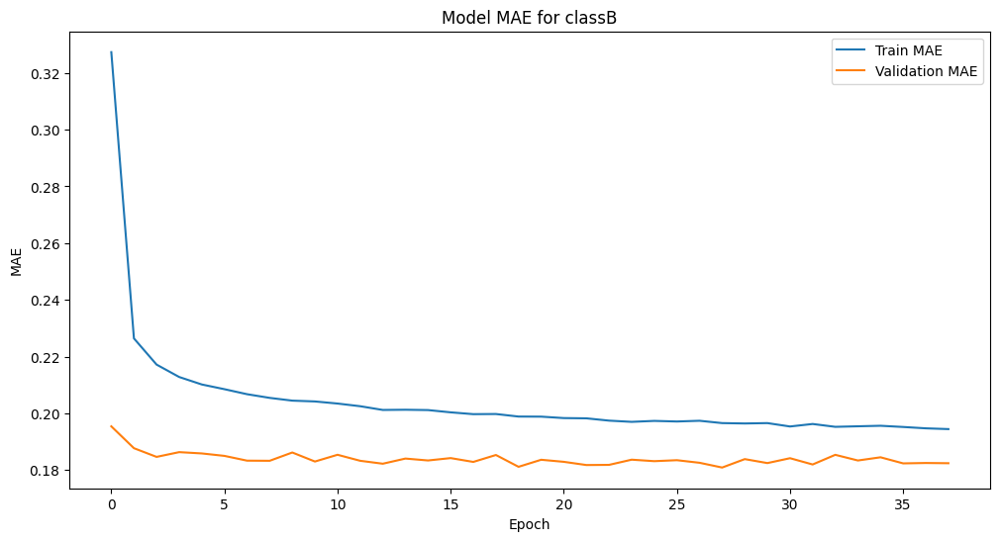

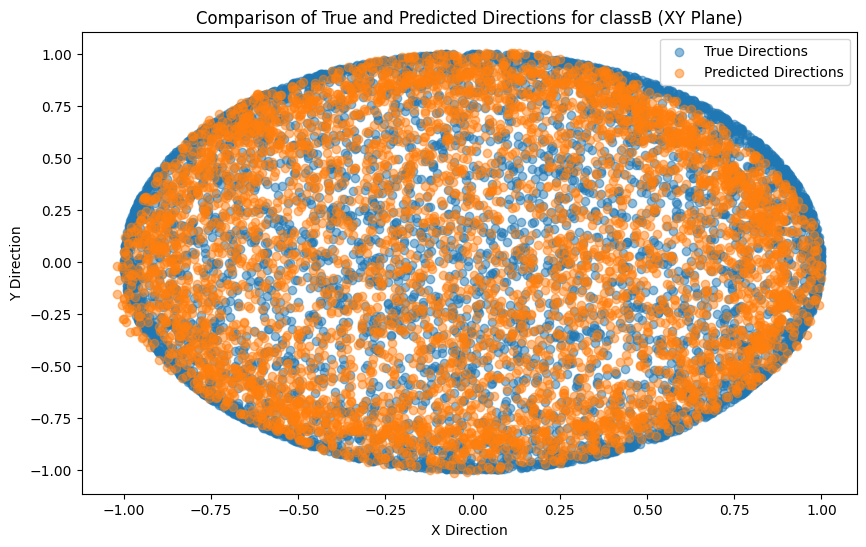

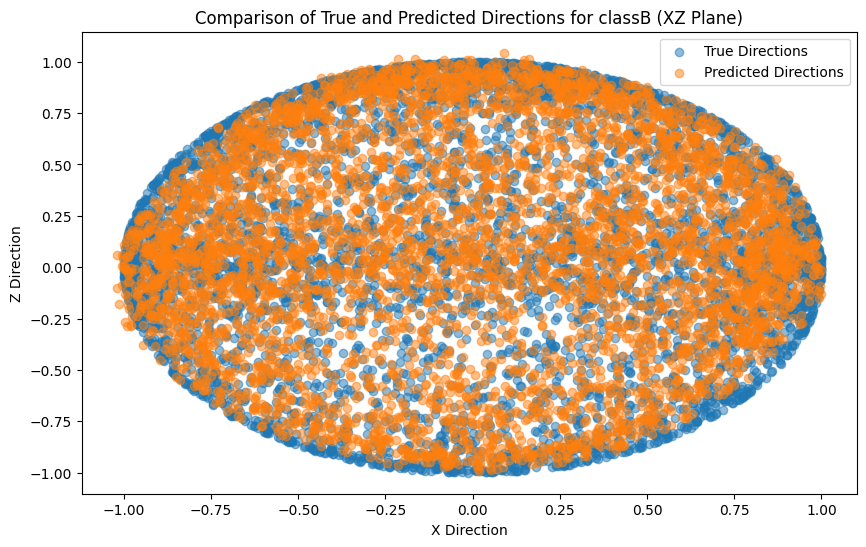

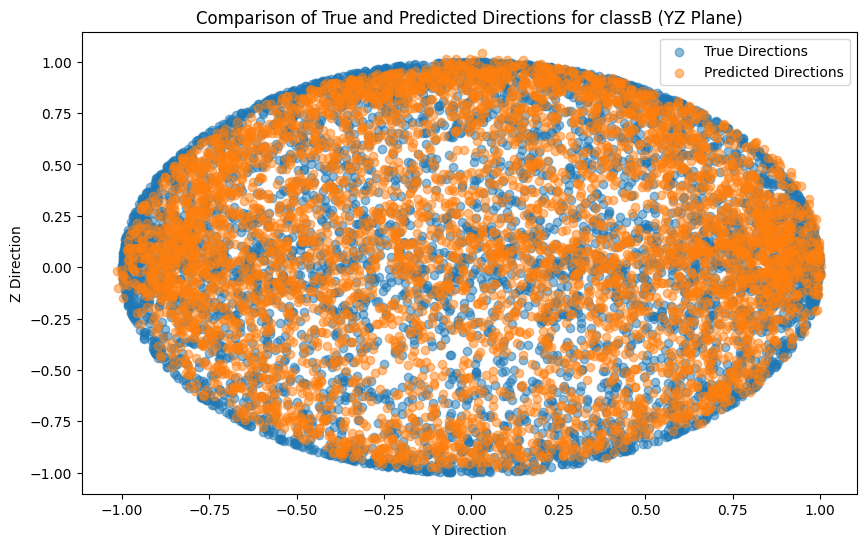

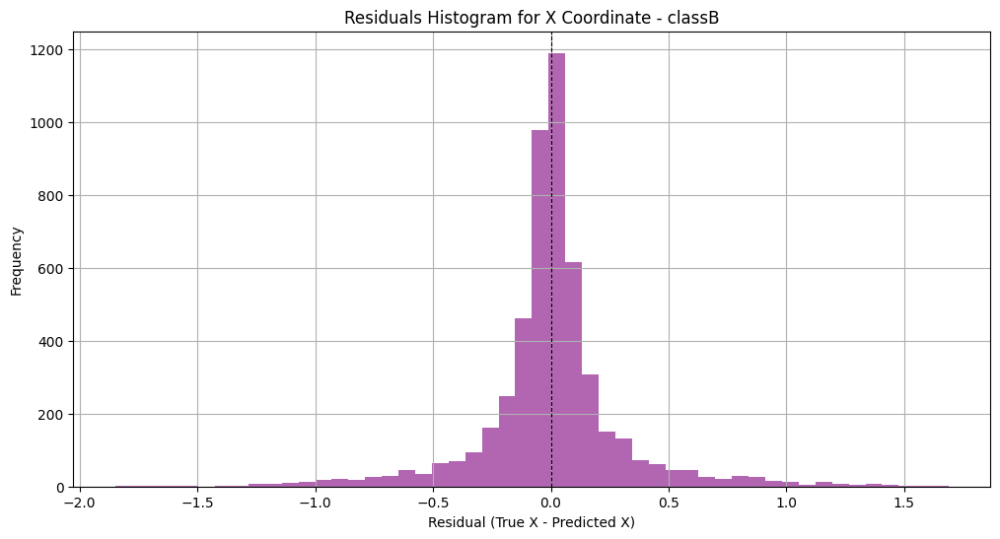

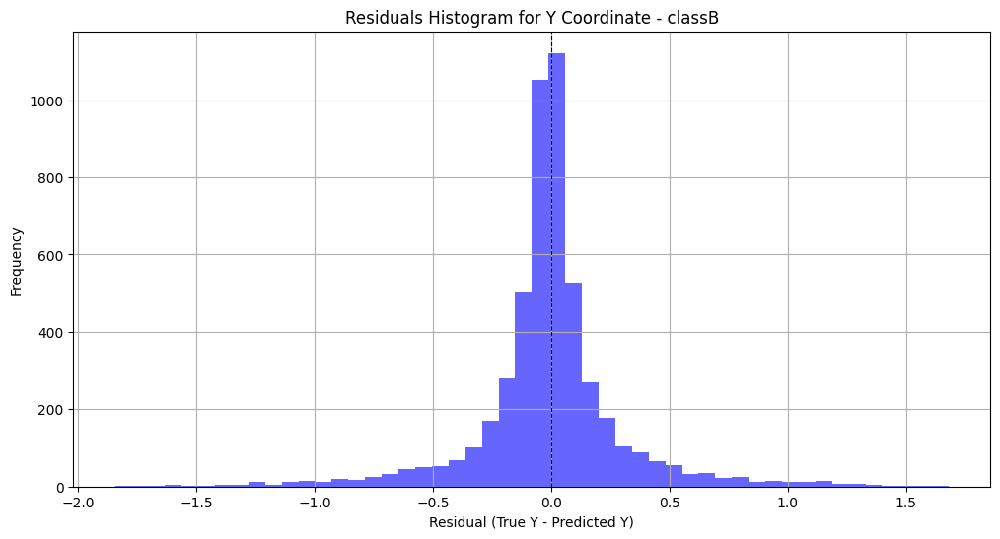

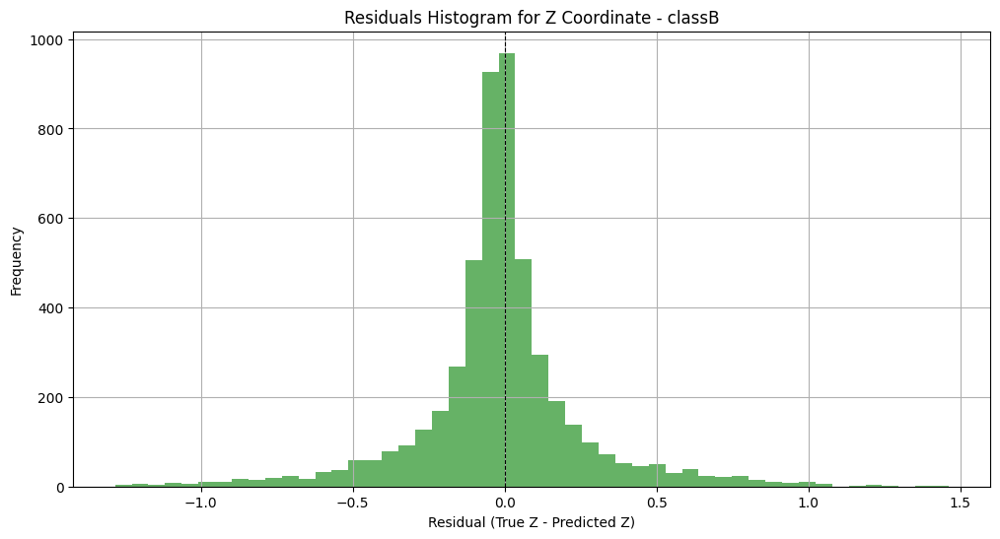

In [62]:
class_name = 'classB'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Training the model on class C data**

Epoch 1/50


c:\Users\DADEN\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


267/267 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4813 - mae: 0.4813 - val_loss: 0.4304 - val_mae: 0.4304
Epoch 2/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.4228 - mae: 0.4228 - val_loss: 0.3609 - val_mae: 0.3609
Epoch 3/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3639 - mae: 0.3639 - val_loss: 0.3259 - val_mae: 0.3259
Epoch 4/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3408 - mae: 0.3408 - val_loss: 0.3096 - val_mae: 0.3096
Epoch 5/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3207 - mae: 0.3207 - val_loss: 0.3065 - val_mae: 0.3065
Epoch 6/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3189 - mae: 0.3189 - val_loss: 0.3067 - val_mae: 0.3067
Epoch 7/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3176 - mae: 0.3176 - val_loss: 0.3037 - val_mae: 0.3037
Epoch 8/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3191 - mae: 0.3191 - val_loss: 0.3041 - val_mae: 0.3041
Epoch 9/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3137 

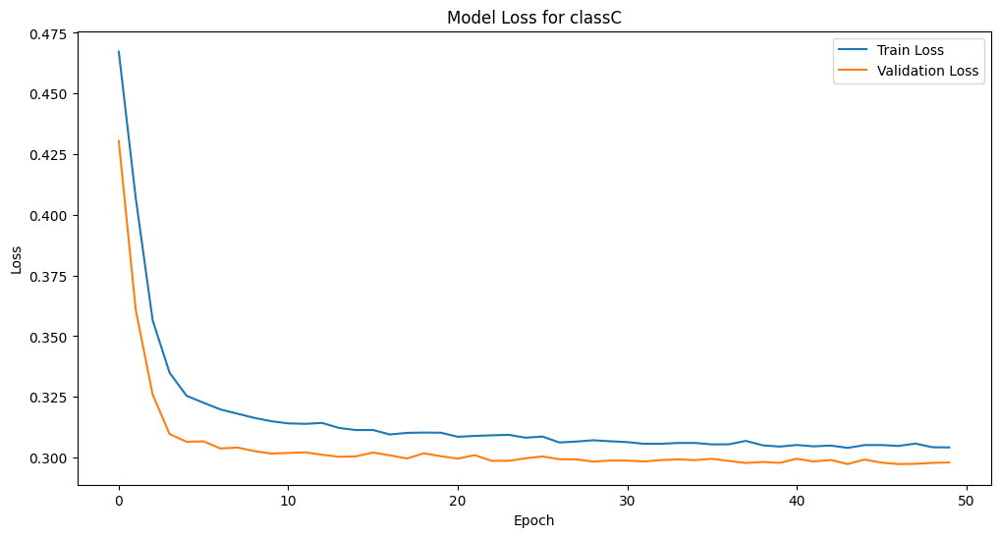

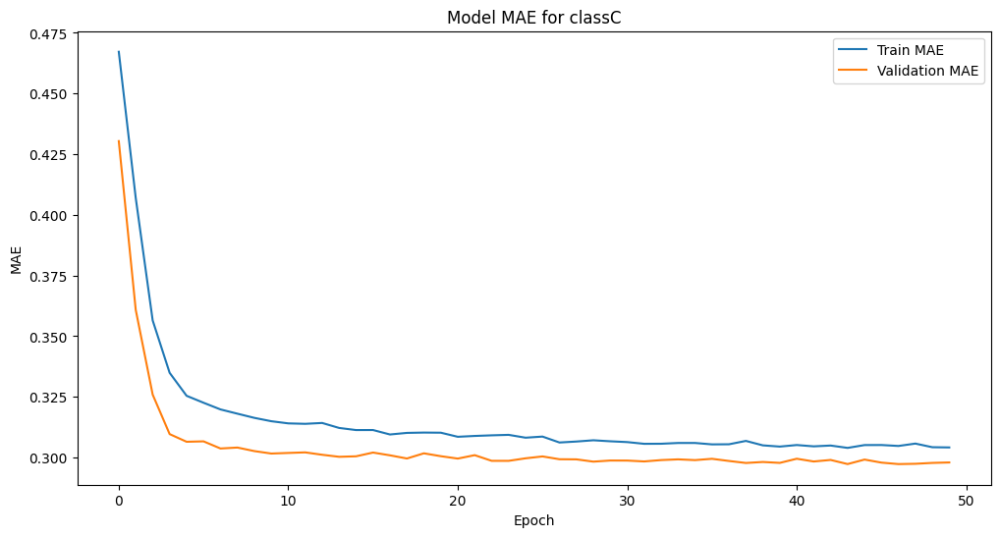

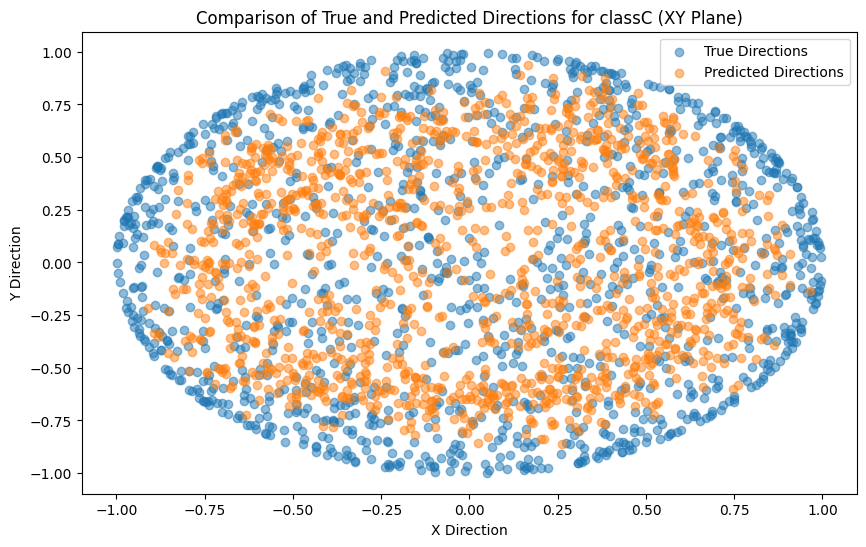

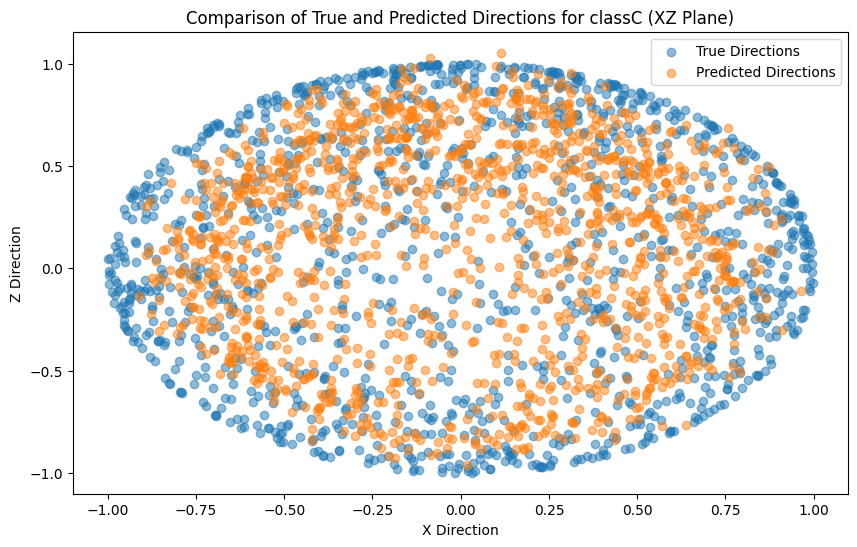

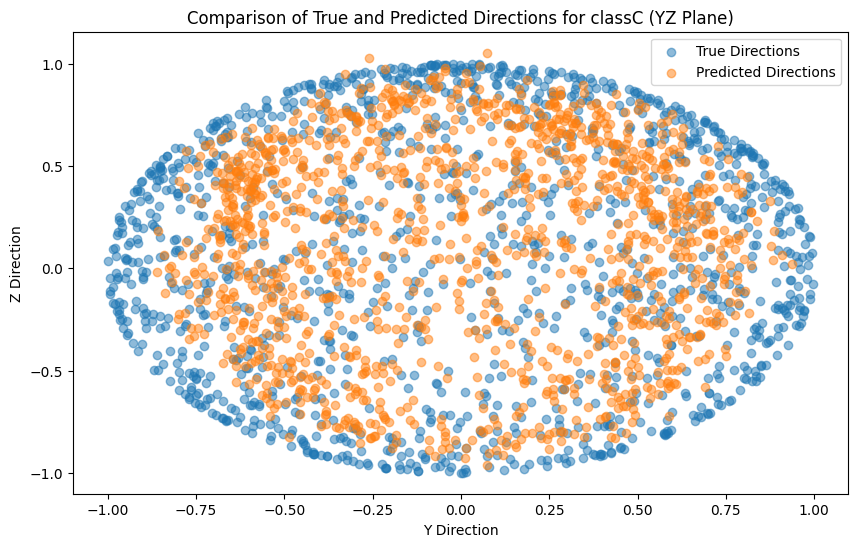

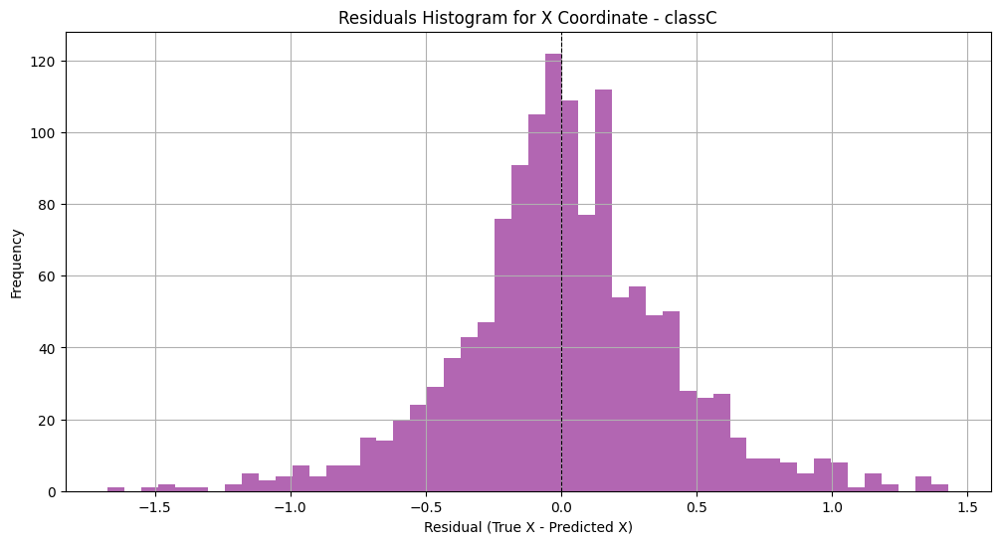

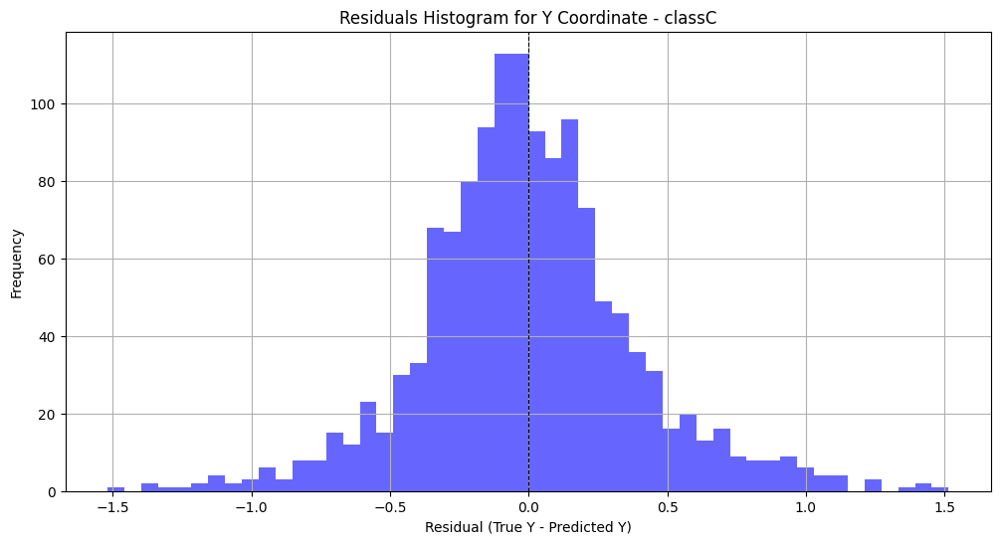

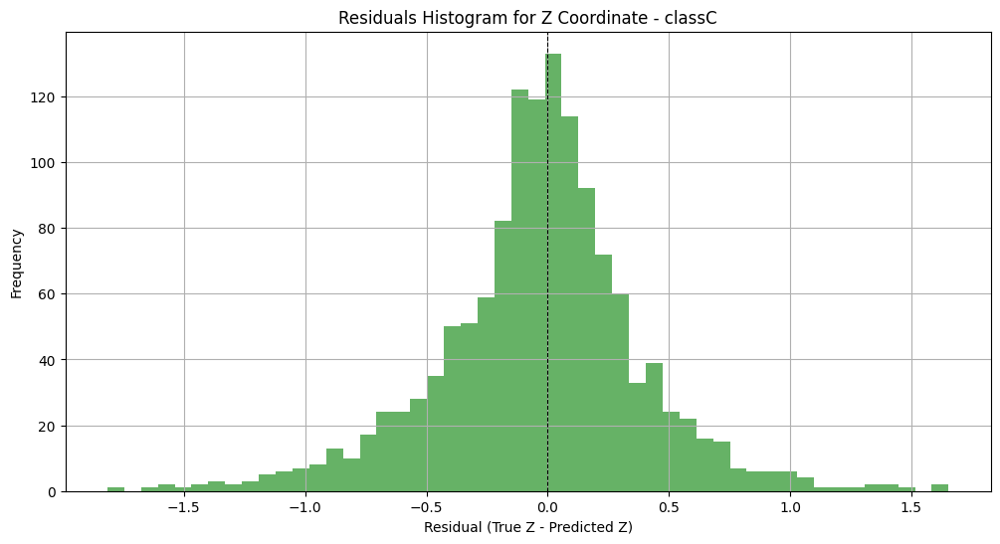

In [63]:
class_name = 'classC'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Training the model on class D data**

Epoch 1/50


c:\Users\DADEN\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1742/1742 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3911 - mae: 0.3911 - val_loss: 0.2457 - val_mae: 0.2457
Epoch 2/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2633 - mae: 0.2633 - val_loss: 0.2428 - val_mae: 0.2428
Epoch 3/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2551 - mae: 0.2551 - val_loss: 0.2410 - val_mae: 0.2410
Epoch 4/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2514 - mae: 0.2514 - val_loss: 0.2402 - val_mae: 0.2402
Epoch 5/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2521 - mae: 0.2521 - val_loss: 0.2408 - val_mae: 0.2408
Epoch 6/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2489 - mae: 0.2489 - val_loss: 0.2391 - val_mae: 0.2391
Epoch 7/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2500 - mae: 0.2500 - val_loss: 0.2395 - val_mae: 0.2395
Epoch 8/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2488 - mae: 0.2488 - val_loss: 0.2408 - val_mae: 0.2408
Epoch 9/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/st

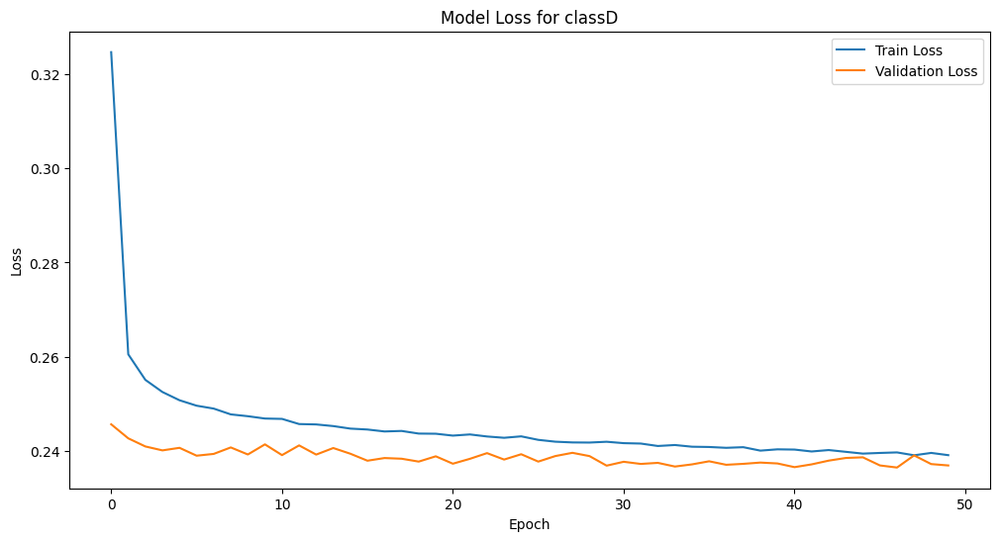

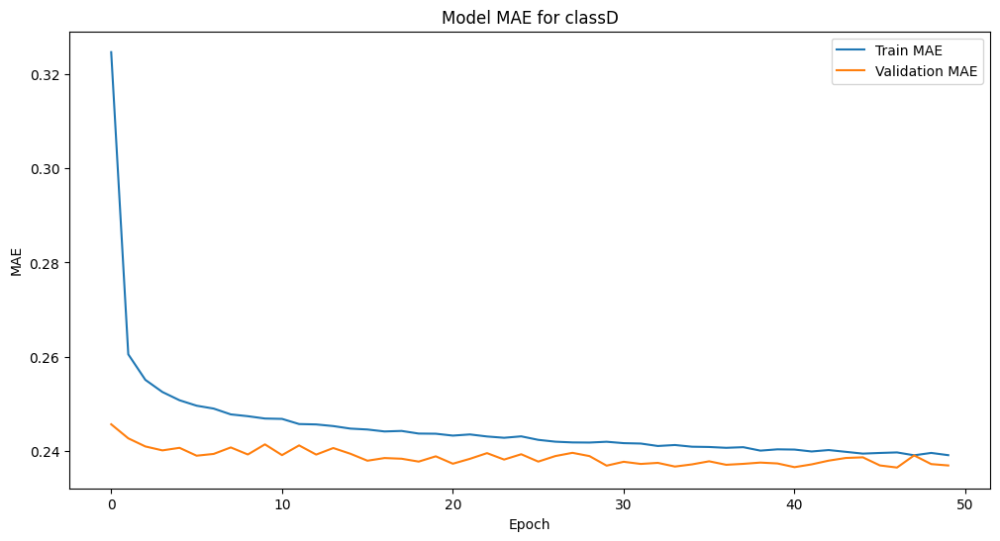

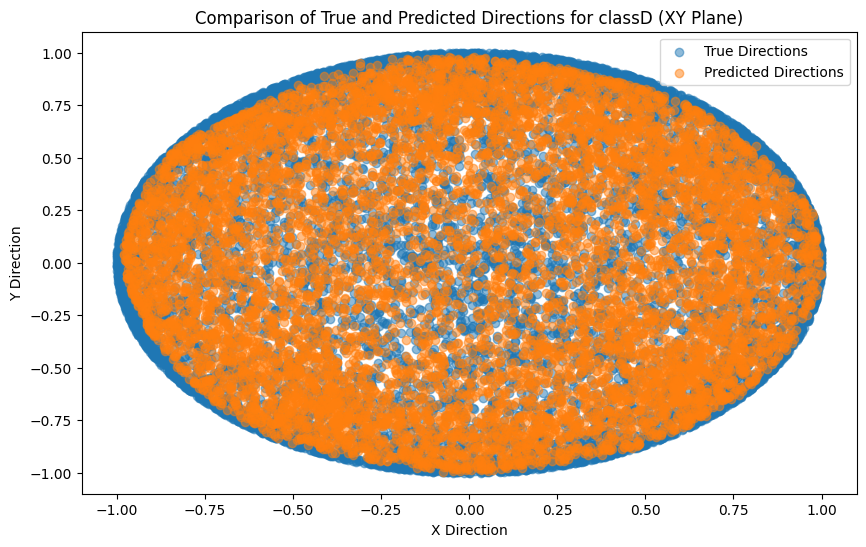

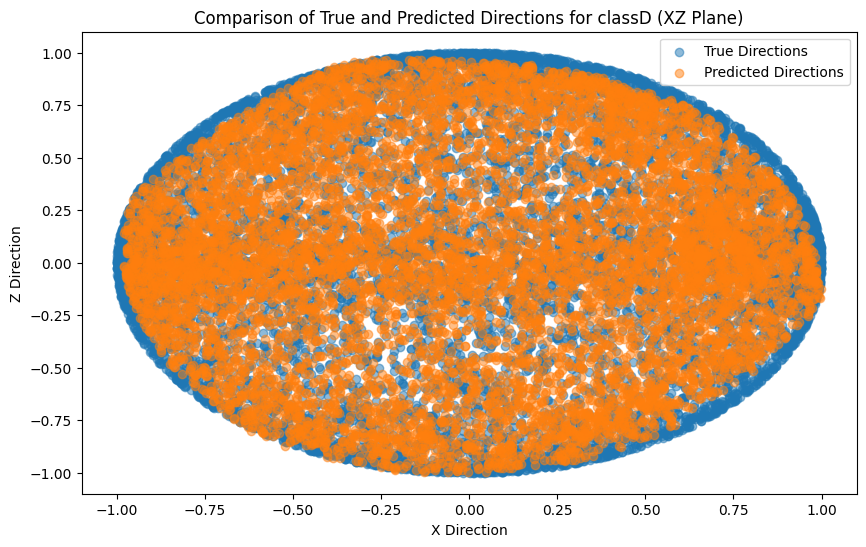

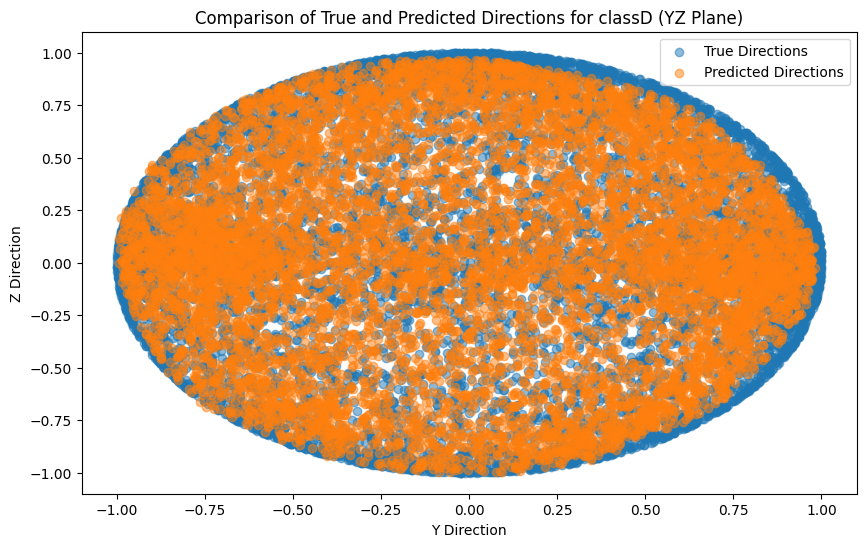

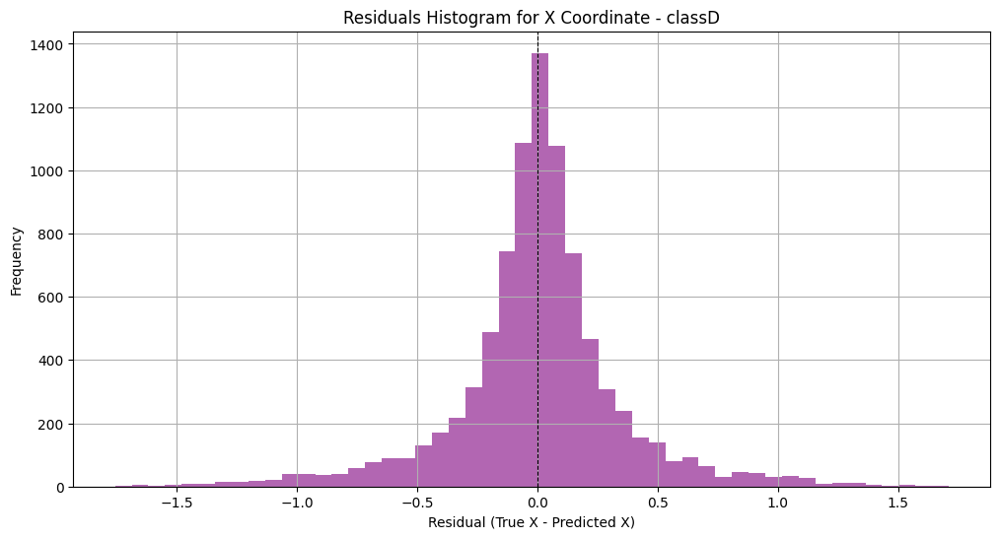

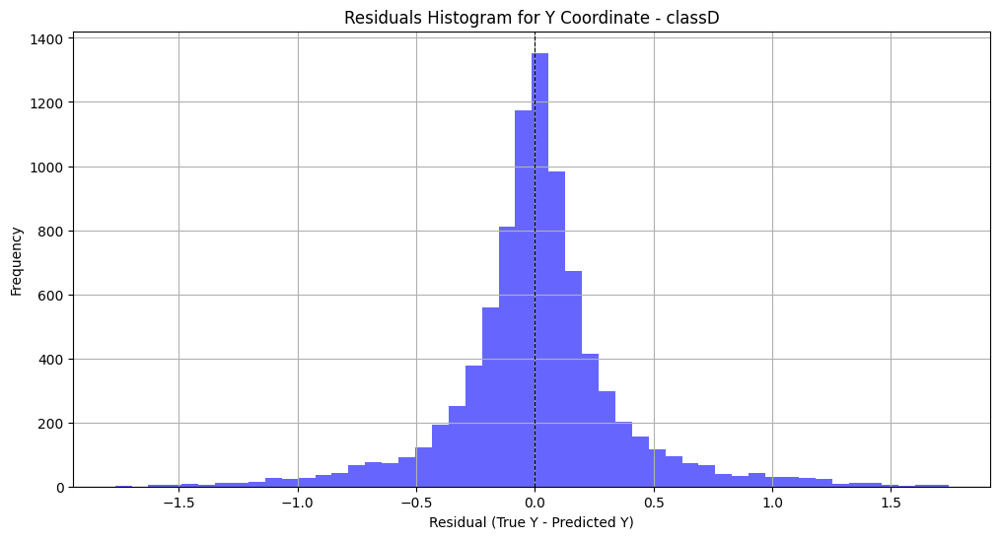

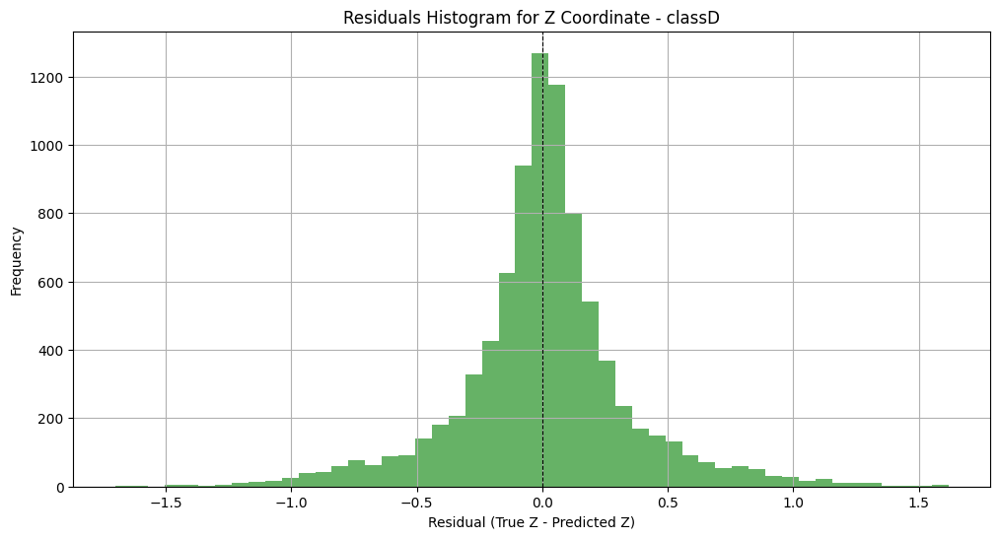

In [64]:
class_name = 'classD'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Training the model on class E data**

Epoch 1/50


c:\Users\DADEN\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


901/901 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.4417 - mae: 0.4417 - val_loss: 0.2960 - val_mae: 0.2960
Epoch 2/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.3098 - mae: 0.3098 - val_loss: 0.2912 - val_mae: 0.2912
Epoch 3/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.3022 - mae: 0.3022 - val_loss: 0.2906 - val_mae: 0.2906
Epoch 4/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.3007 - mae: 0.3007 - val_loss: 0.2893 - val_mae: 0.2893
Epoch 5/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2979 - mae: 0.2979 - val_loss: 0.2885 - val_mae: 0.2885
Epoch 6/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2998 - mae: 0.2998 - val_loss: 0.2888 - val_mae: 0.2888
Epoch 7/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2949 - mae: 0.2949 - val_loss: 0.2876 - val_mae: 0.2876
Epoch 8/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2978 - mae: 0.2978 - val_loss: 0.2874 - val_mae: 0.2874
Epoch 9/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2912 

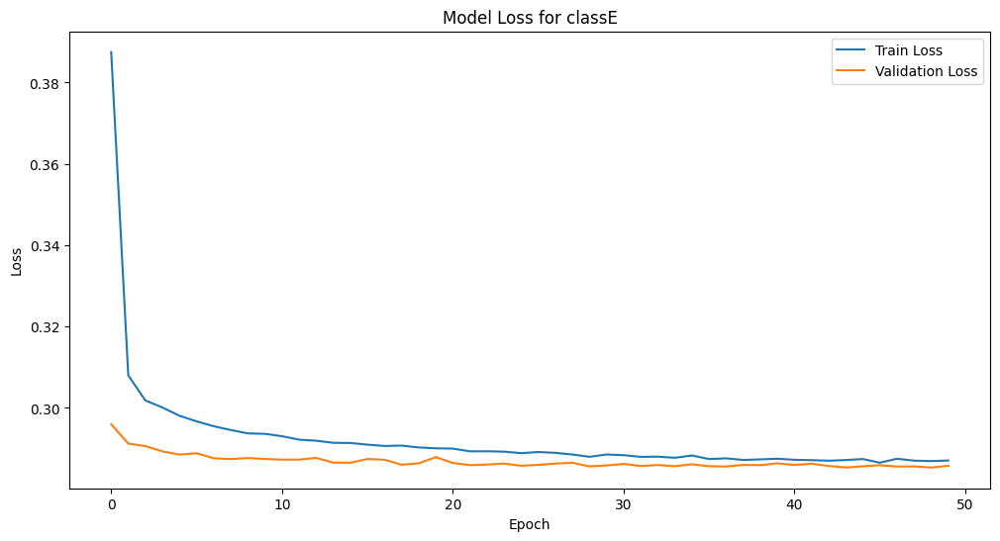

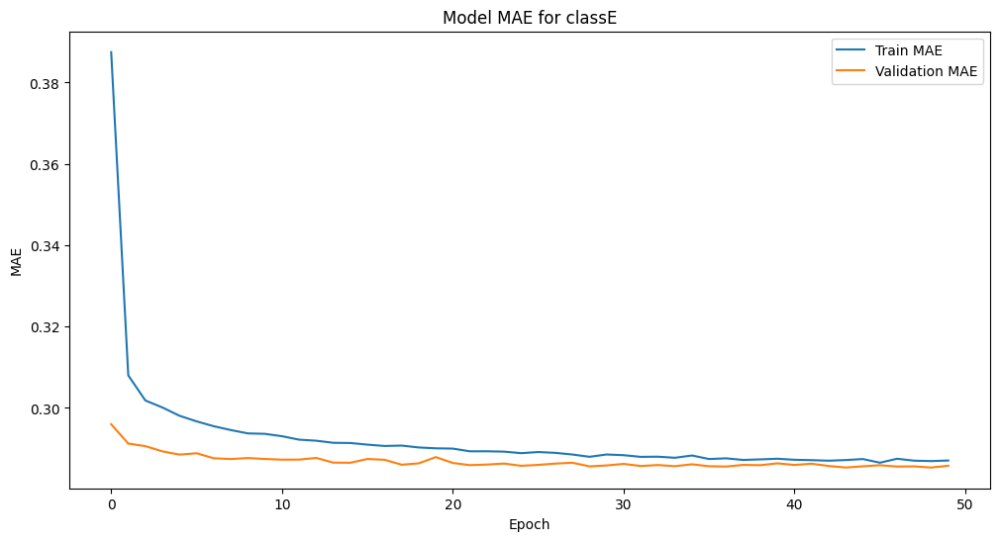

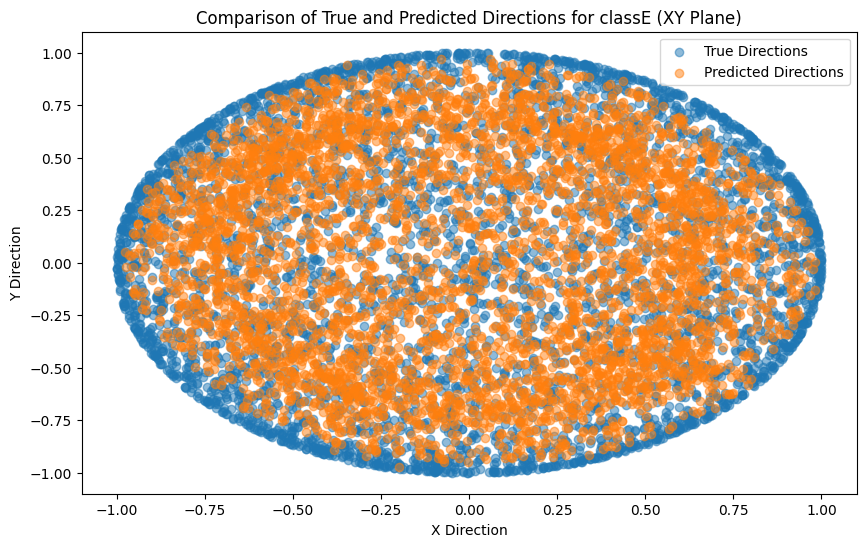

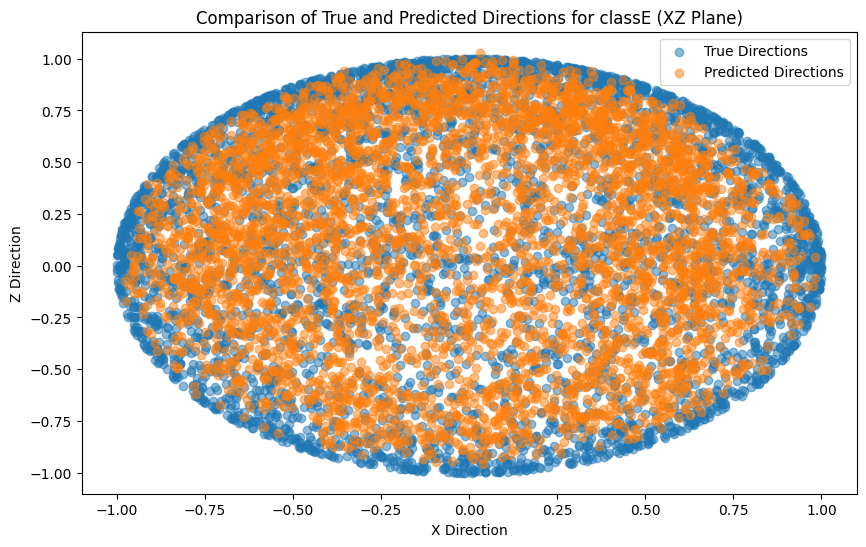

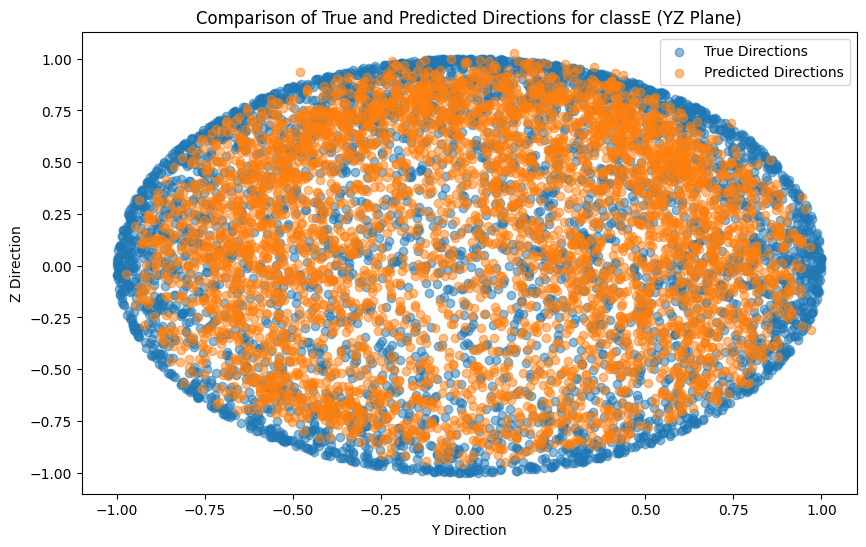

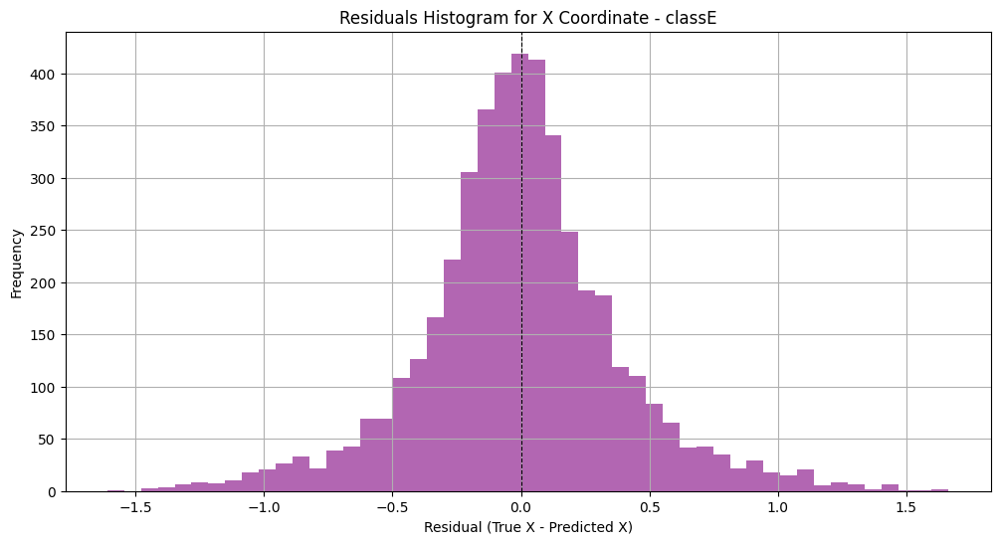

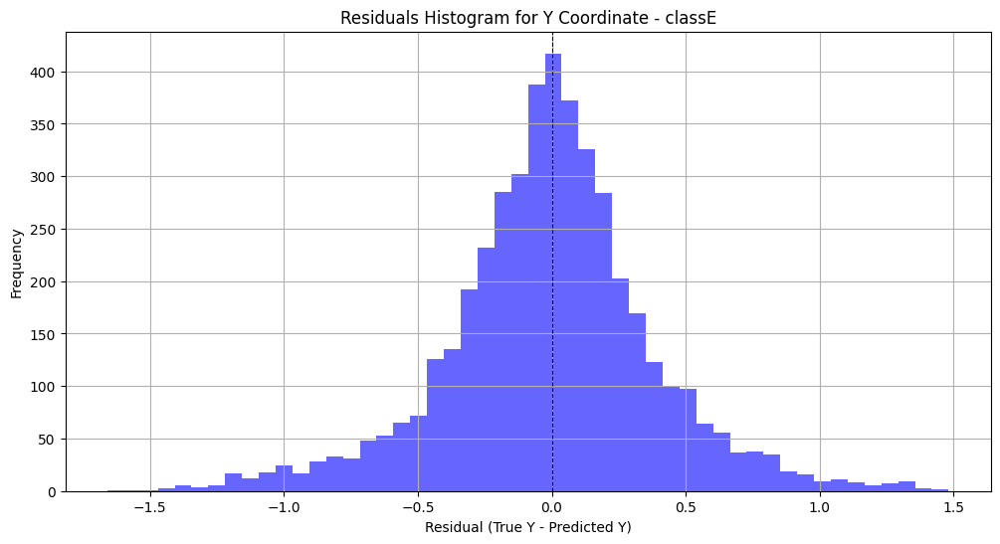

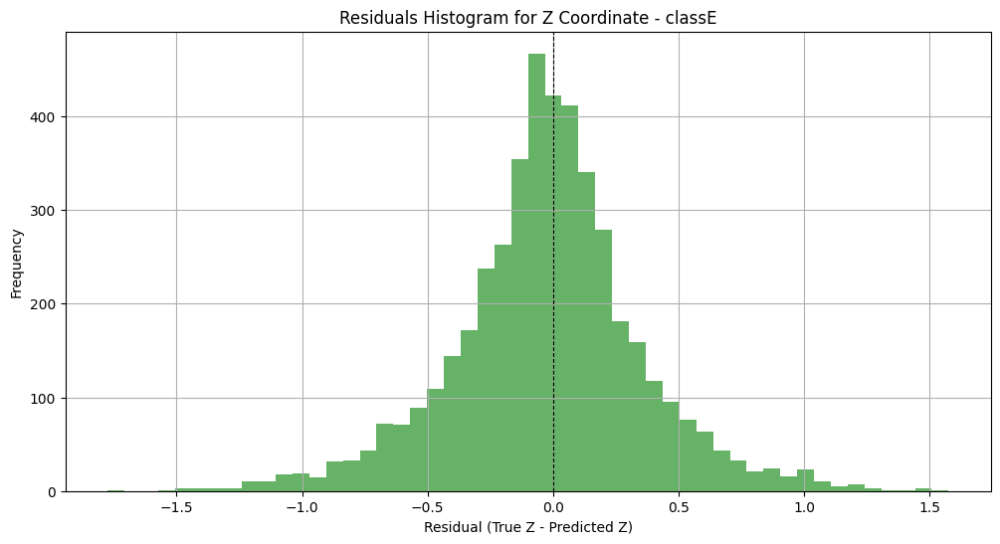

In [65]:
class_name = 'classE'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Training the model on class F data**

Epoch 1/50


c:\Users\DADEN\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2459/2459 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.3673 - mae: 0.3673 - val_loss: 0.2126 - val_mae: 0.2126
Epoch 2/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2365 - mae: 0.2365 - val_loss: 0.2089 - val_mae: 0.2089
Epoch 3/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2279 - mae: 0.2279 - val_loss: 0.2093 - val_mae: 0.2093
Epoch 4/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2264 - mae: 0.2264 - val_loss: 0.2079 - val_mae: 0.2079
Epoch 5/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2230 - mae: 0.2230 - val_loss: 0.2107 - val_mae: 0.2107
Epoch 6/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2226 - mae: 0.2226 - val_loss: 0.2068 - val_mae: 0.2068
Epoch 7/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2211 - mae: 0.2211 - val_loss: 0.2063 - val_mae: 0.2063
Epoch 8/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2193 - mae: 0.2193 - val_loss: 0.2055 - val_mae: 0.2055
Epoch 9/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/st

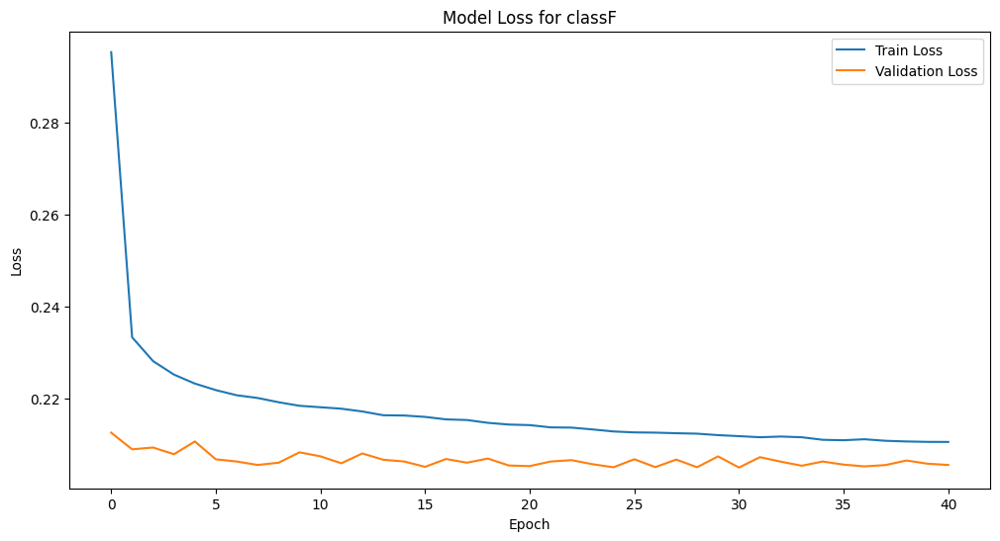

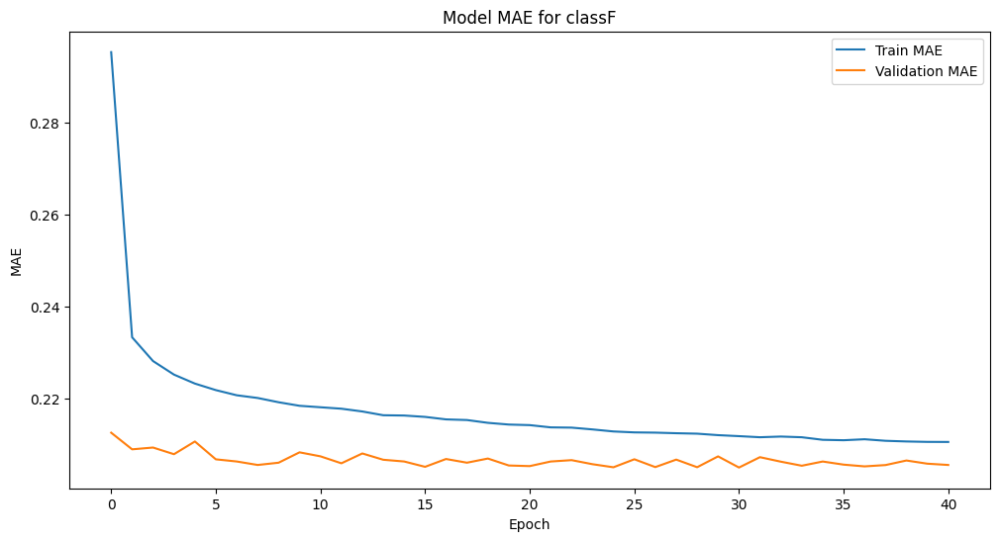

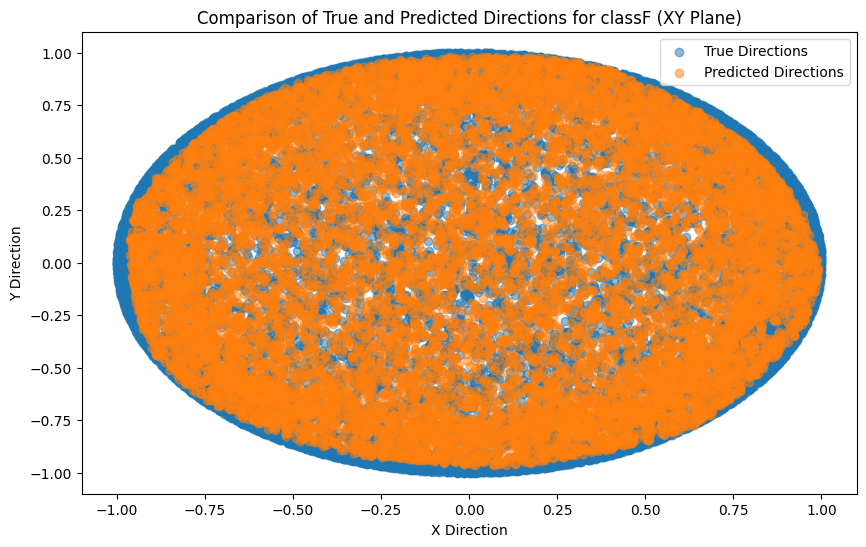

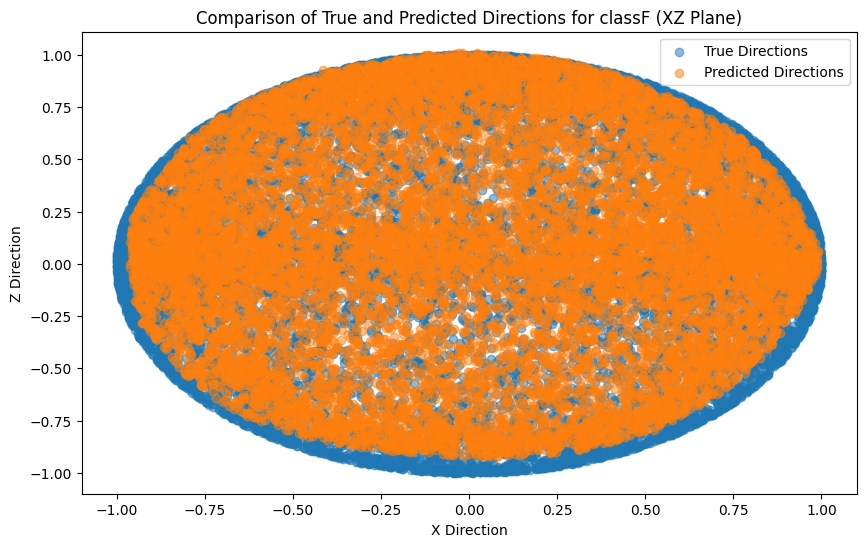

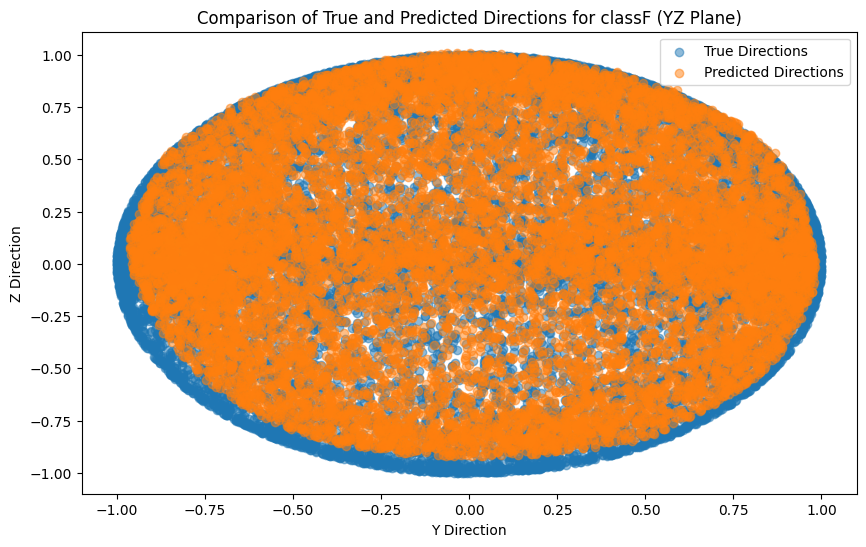

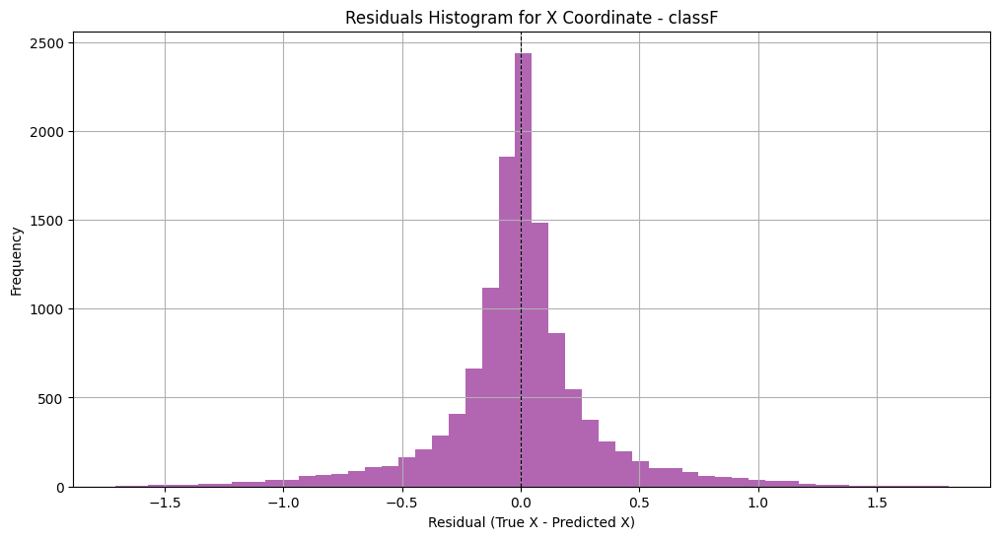

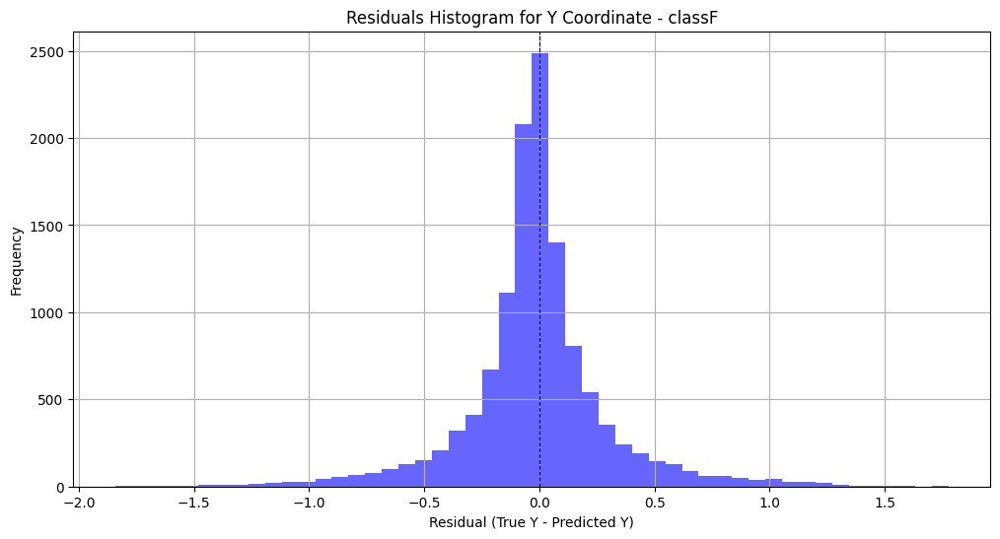

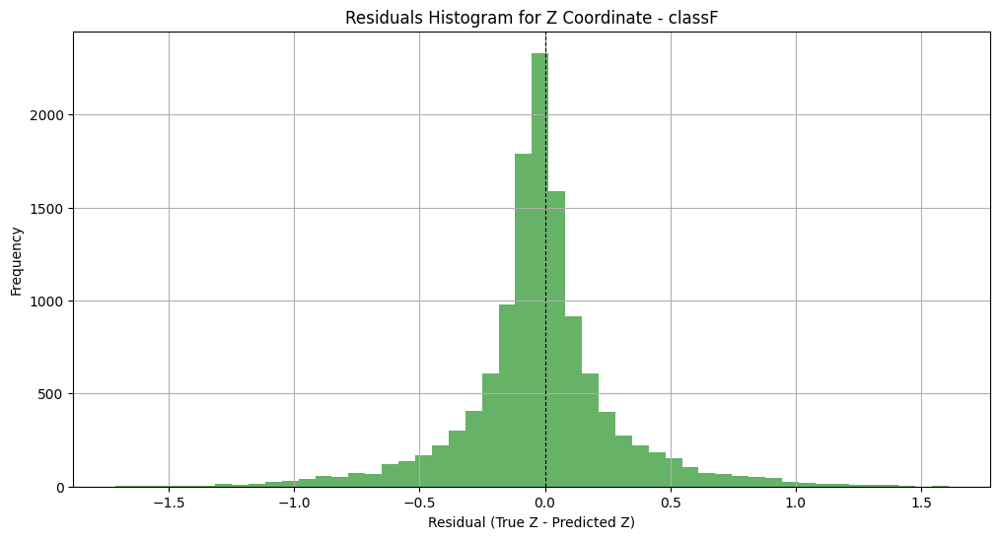

In [66]:
class_name = 'classF'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Training the model on class G data**

Epoch 1/50


c:\Users\DADEN\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1973/1973 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.4212 - mae: 0.4212 - val_loss: 0.3017 - val_mae: 0.3017
Epoch 2/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3155 - mae: 0.3155 - val_loss: 0.2981 - val_mae: 0.2981
Epoch 3/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3073 - mae: 0.3073 - val_loss: 0.2967 - val_mae: 0.2967
Epoch 4/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3064 - mae: 0.3064 - val_loss: 0.2950 - val_mae: 0.2950
Epoch 5/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3053 - mae: 0.3053 - val_loss: 0.2948 - val_mae: 0.2948
Epoch 6/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3051 - mae: 0.3051 - val_loss: 0.2938 - val_mae: 0.2938
Epoch 7/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3040 - mae: 0.3040 - val_loss: 0.2939 - val_mae: 0.2939
Epoch 8/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3022 - mae: 0.3022 - val_loss: 0.2939 - val_mae: 0.2939
Epoch 9/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/st

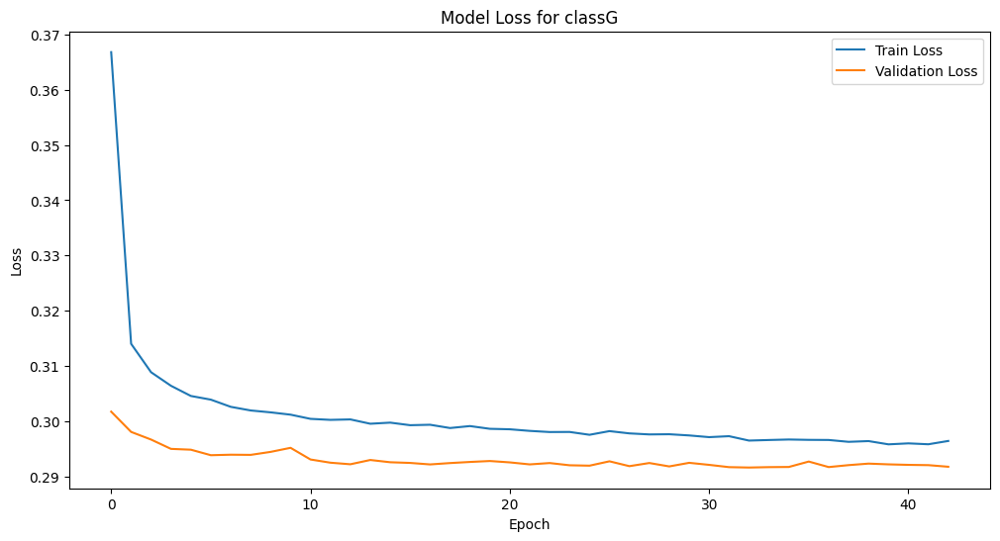

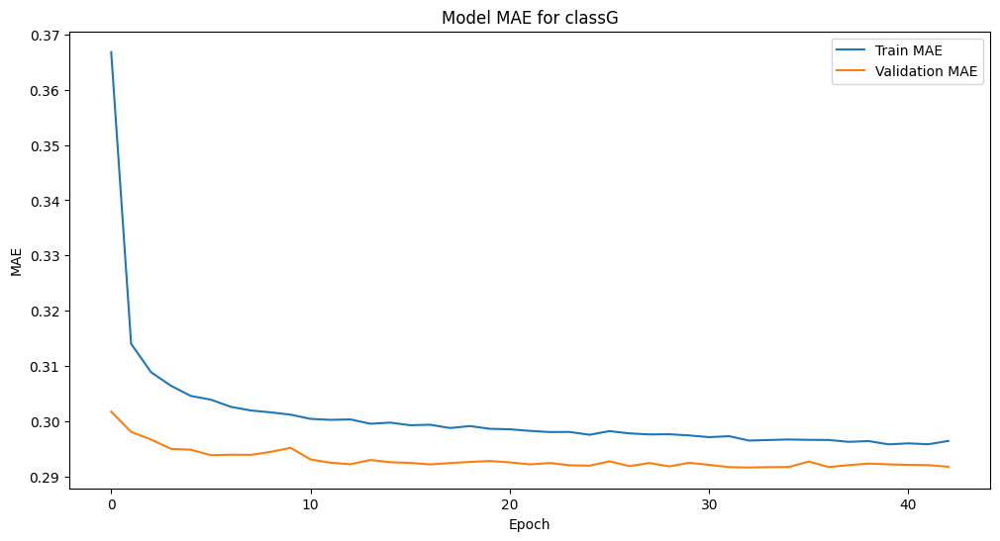

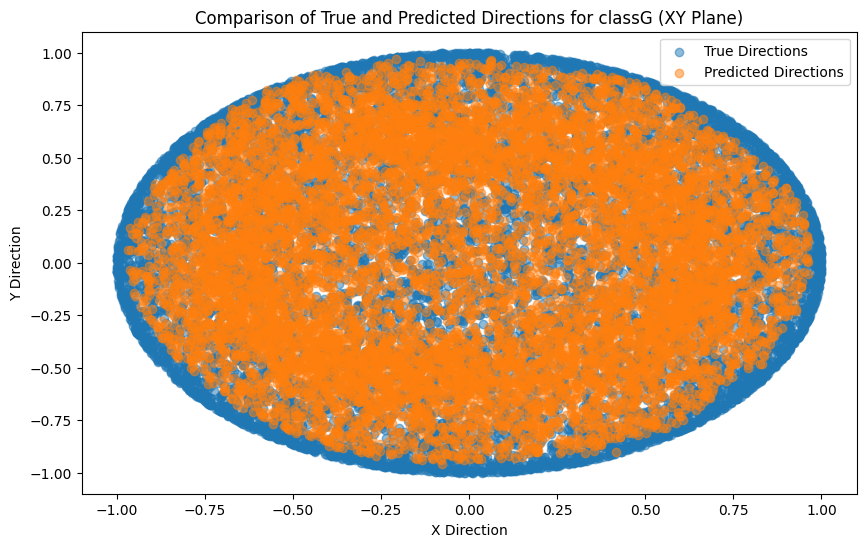

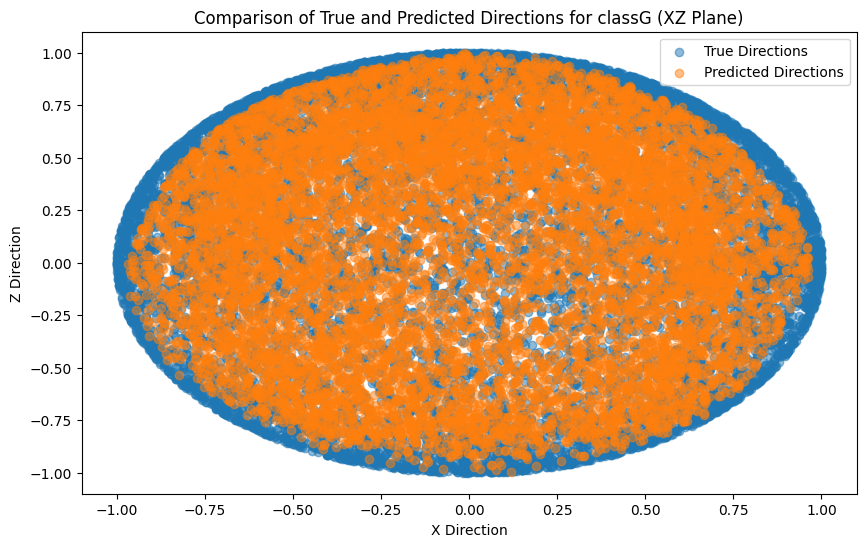

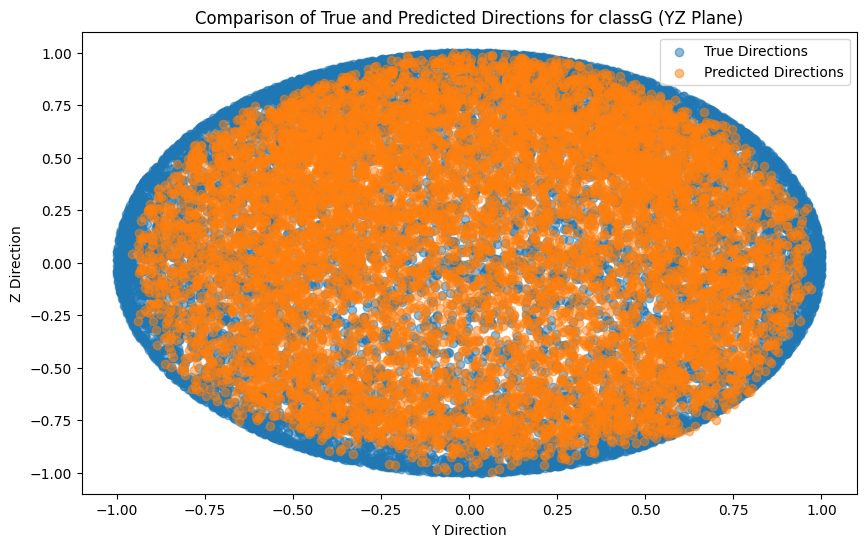

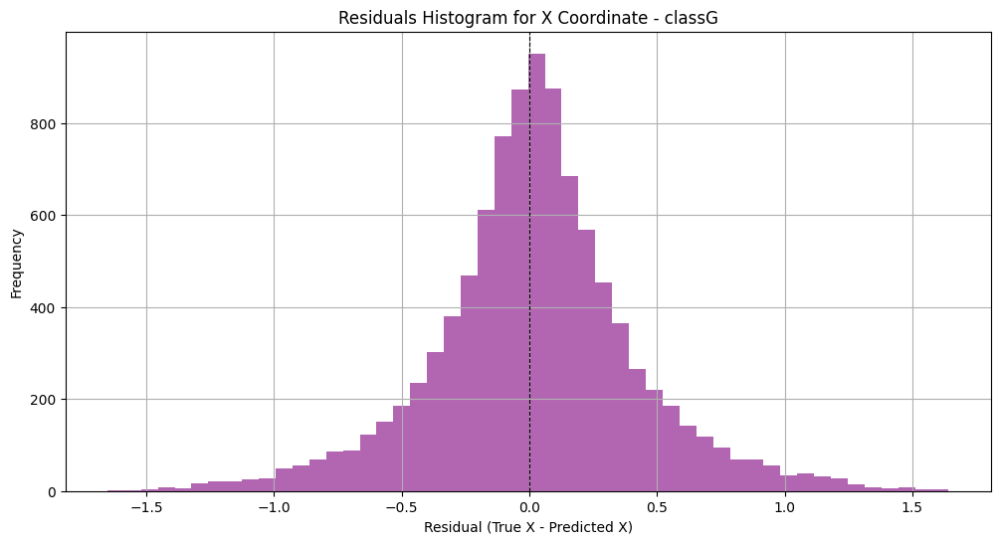

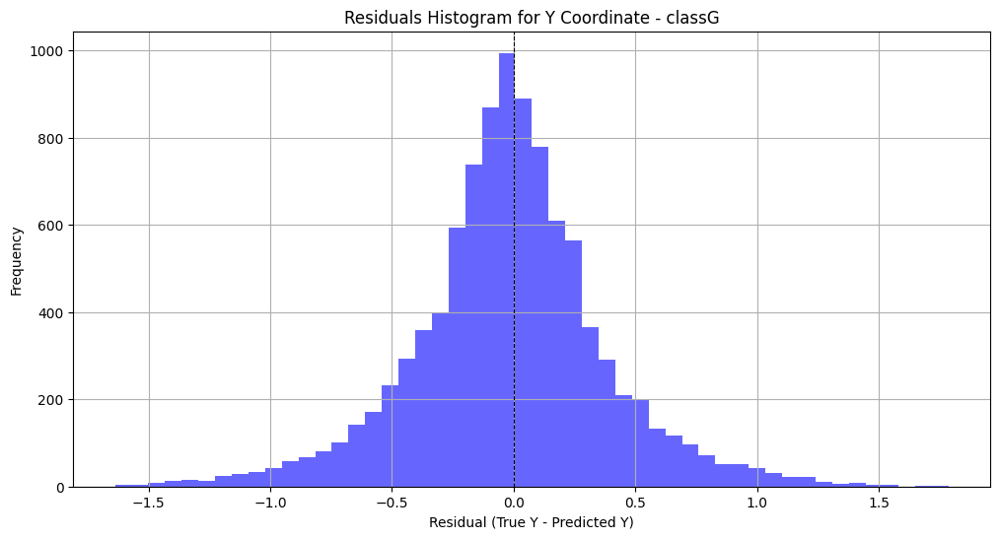

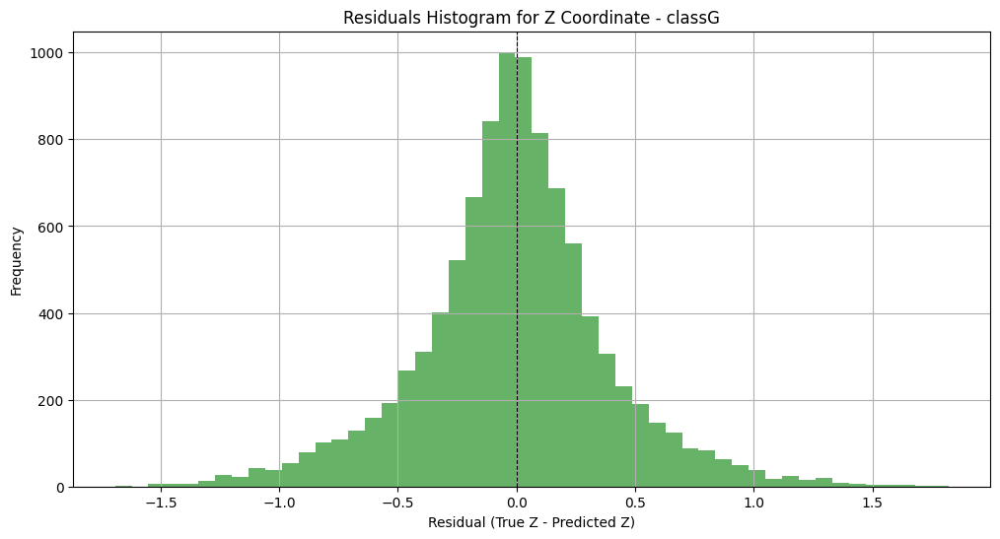

In [67]:
class_name = 'classG'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Training the model on class H data**

Epoch 1/50


c:\Users\DADEN\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1730/1730 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3893 - mae: 0.3893 - val_loss: 0.2519 - val_mae: 0.2519
Epoch 2/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2698 - mae: 0.2698 - val_loss: 0.2497 - val_mae: 0.2497
Epoch 3/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2629 - mae: 0.2629 - val_loss: 0.2493 - val_mae: 0.2493
Epoch 4/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2593 - mae: 0.2593 - val_loss: 0.2482 - val_mae: 0.2482
Epoch 5/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2601 - mae: 0.2601 - val_loss: 0.2481 - val_mae: 0.2481
Epoch 6/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2565 - mae: 0.2565 - val_loss: 0.2483 - val_mae: 0.2483
Epoch 7/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2561 - mae: 0.2561 - val_loss: 0.2475 - val_mae: 0.2475
Epoch 8/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2554 - mae: 0.2554 - val_loss: 0.2473 - val_mae: 0.2473
Epoch 9/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/st

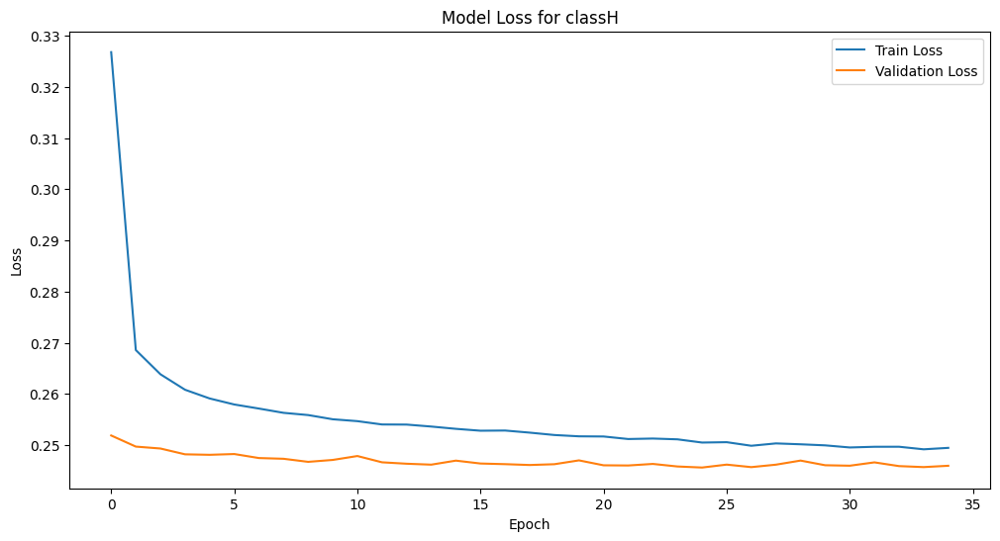

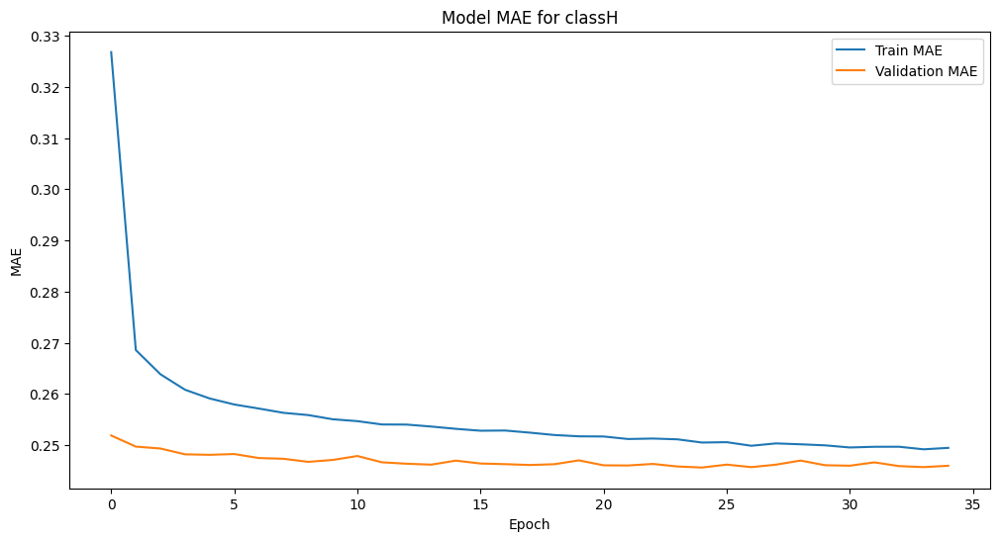

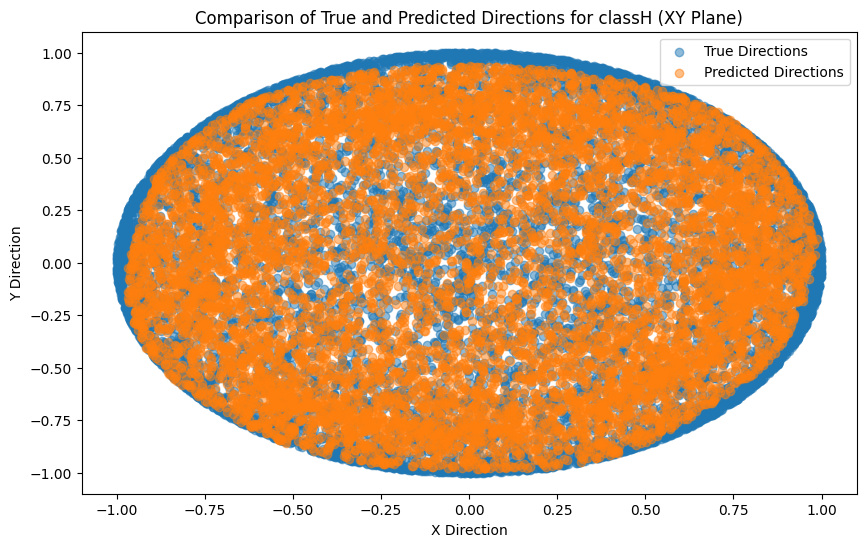

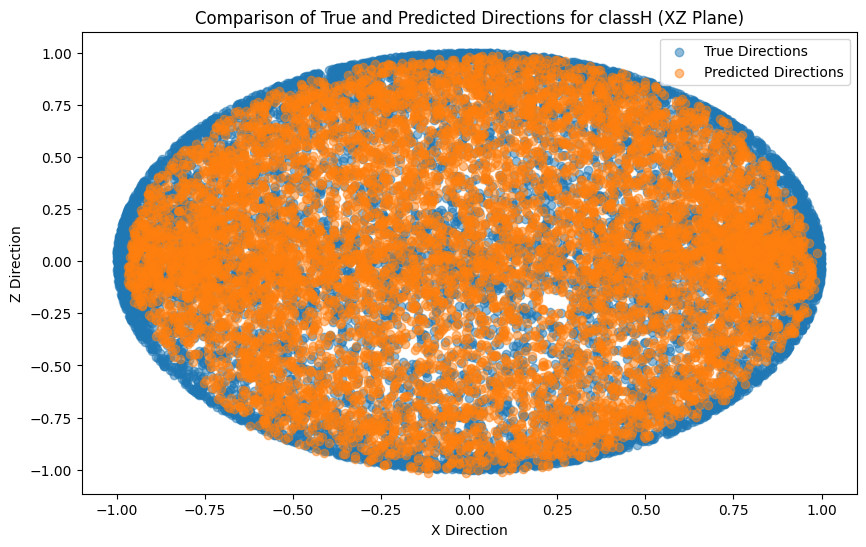

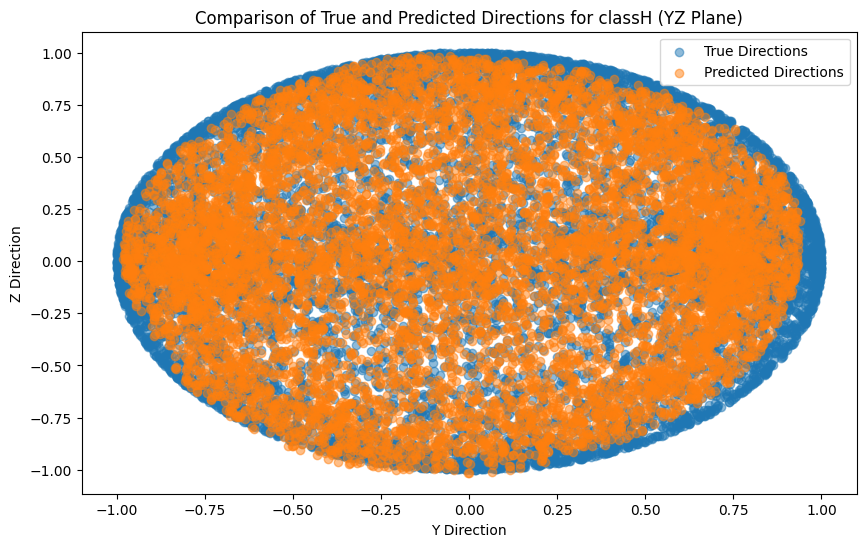

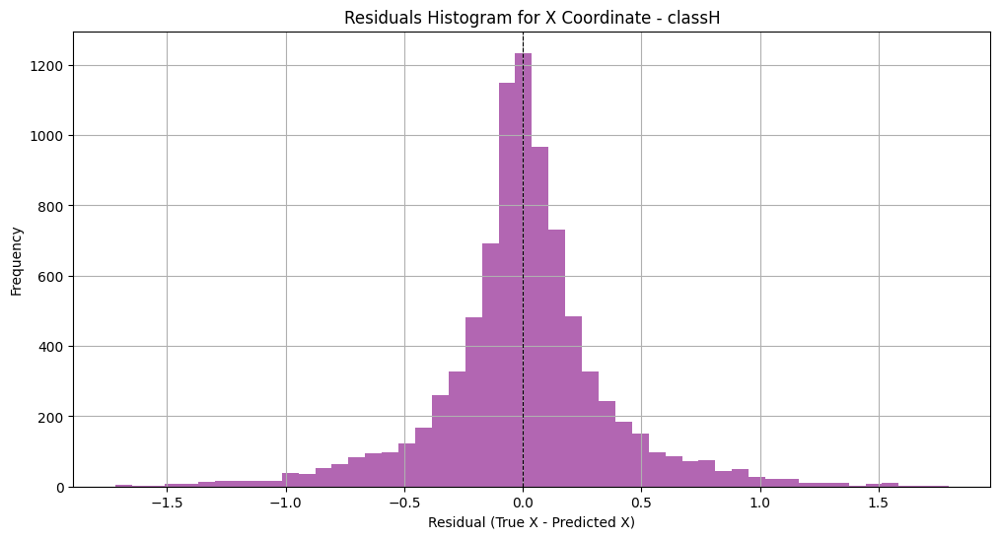

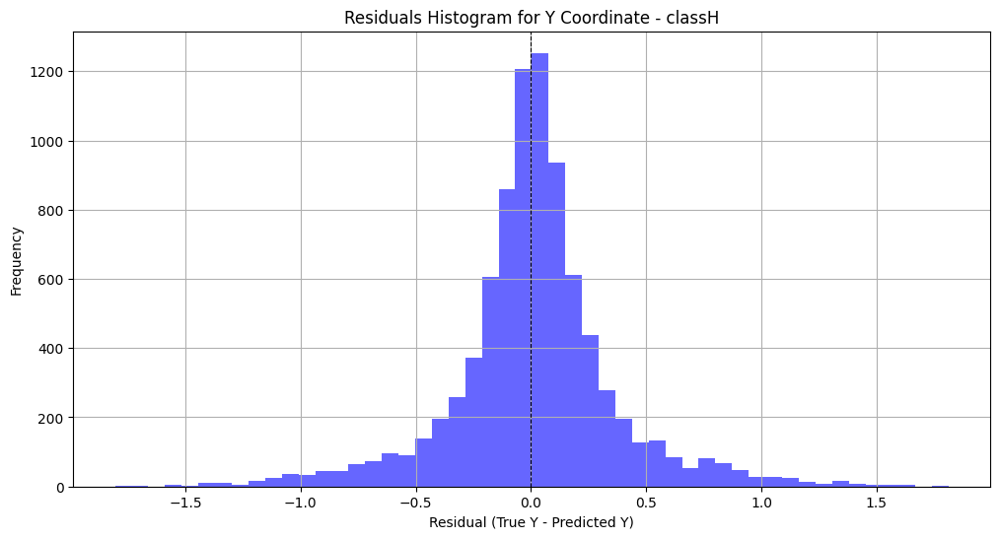

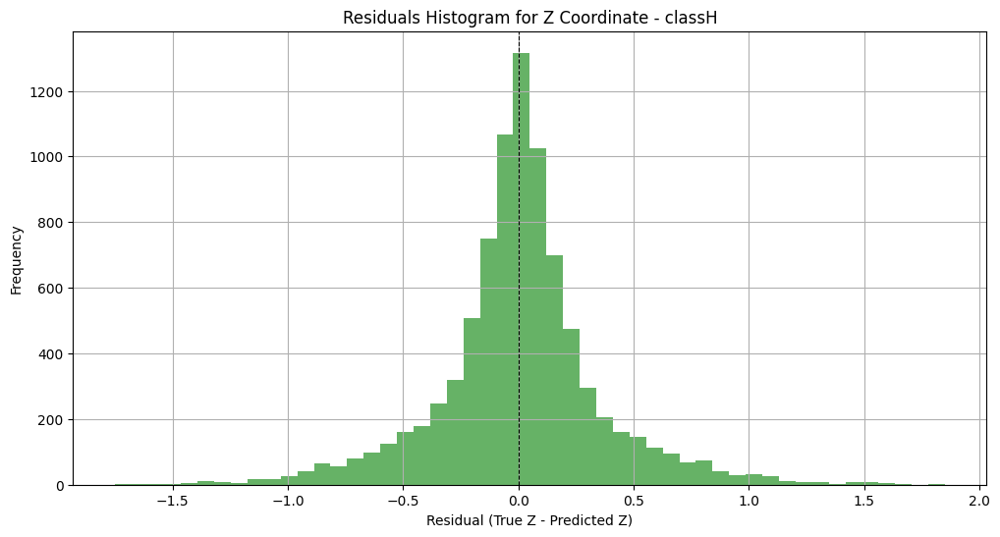

In [68]:
class_name = 'classH'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Summary**

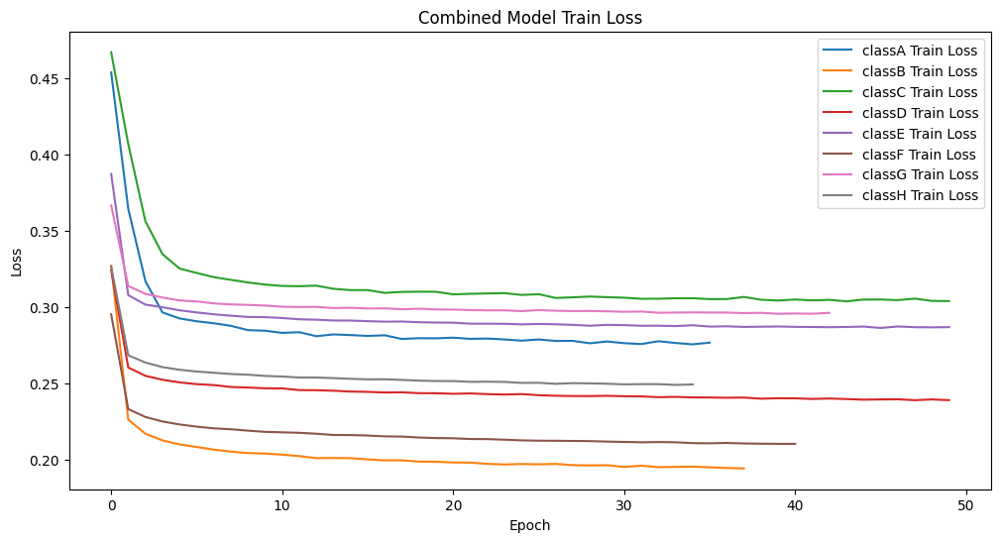

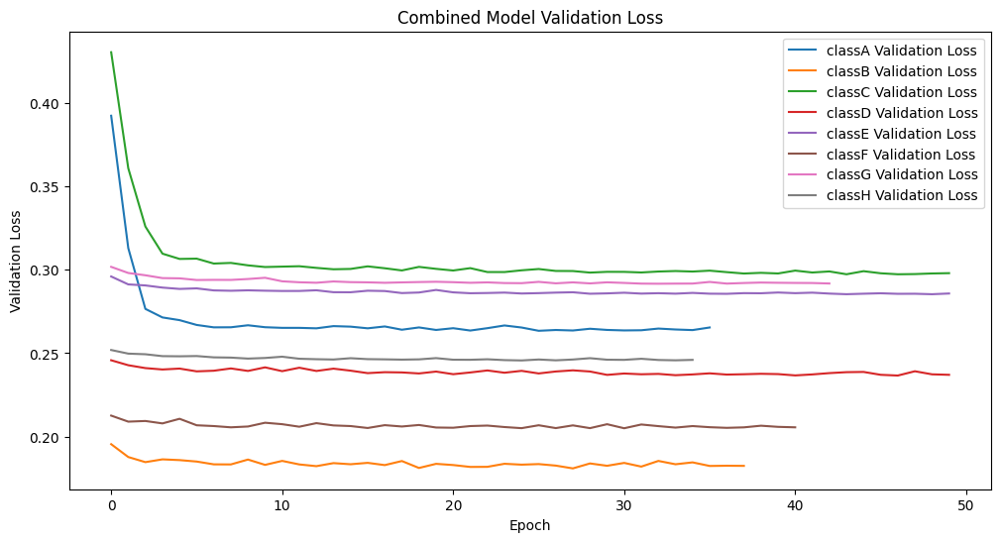

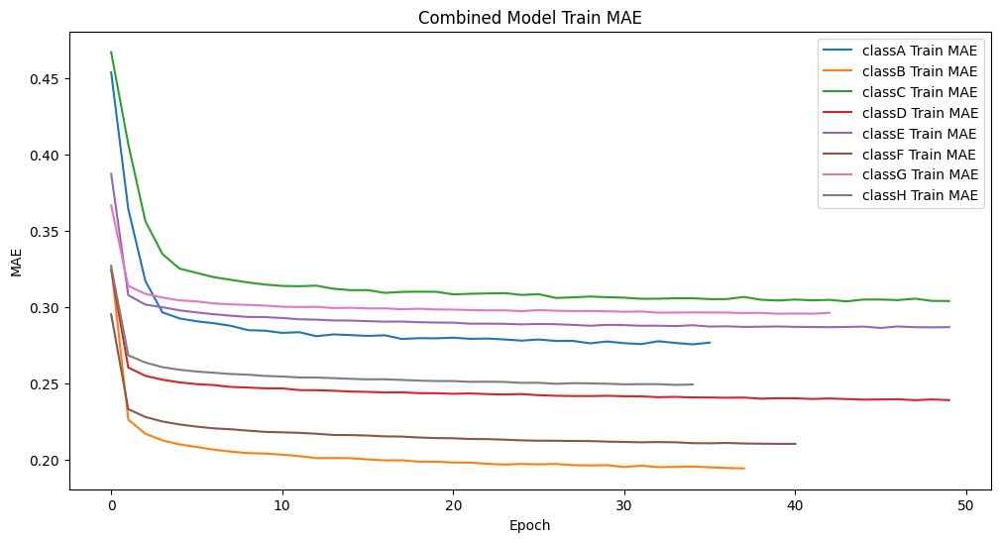

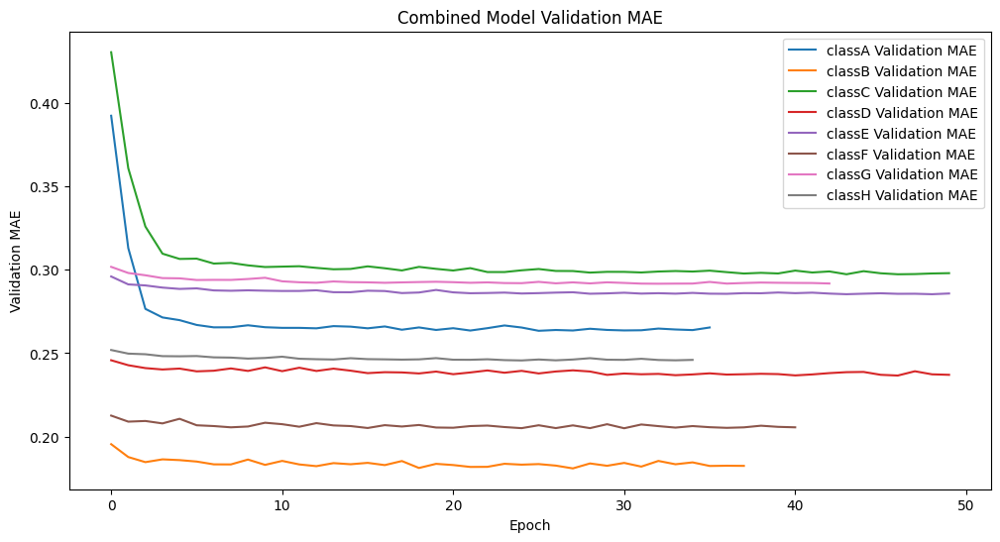

Class: classA, Test MAE: 0.26808011531829834
Class: classB, Test MAE: 0.18117877840995789
Class: classC, Test MAE: 0.295087069272995
Class: classD, Test MAE: 0.23337353765964508
Class: classE, Test MAE: 0.28271999955177307
Class: classF, Test MAE: 0.20575763285160065
Class: classG, Test MAE: 0.29143255949020386
Class: classH, Test MAE: 0.24382461607456207


In [69]:
# Plot combined results
plot_combined_results(histories, predictions)

# Print summary of results
for class_name, result in results.items():
    print(f'Class: {class_name}, Test MAE: {result["mae"]}')